# Let's import required libraries:

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression,ElasticNet
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from scipy import stats
from scipy.stats import skew
import pylab


from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

import joblib
import warnings
warnings.filterwarnings('ignore')

# We will import the train file for analysis now:

In [2]:
pd.set_option('display.max_columns',None)
train=pd.read_csv(r"C:\Users\User\Downloads\Project-Housing_splitted\train.csv")
train=pd.DataFrame(data=train)
train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,BrkFace,31.0,TA,Gd,CBlock,TA,TA,No,BLQ,450,Unf,0,432,882,GasA,TA,Y,SBrkr,900,0,0,900,0,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1970.0,Unf,1,280,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Feedr,Norm,1Fam,1Story,4,5,1949,2003,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,1126,0,0,1126,0,0,2,0,2,1,Gd,5,Typ,0,NaN,Detchd,2002.0,Fin,2,520,TA,TA,N,0,96,0,0,0,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,NPkVill,Norm,Norm,Twnhs,2Story,6,6,1976,1976,Gable,CompShg,Plywood,Brk Cmn,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,566,Unf,0,289,855,GasA,TA,Y,SBrkr,855,601,0,1456,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1976.0,Unf,2,440,TA,TA,Y,87,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Feedr,Norm,1Fam,2Story,4,4,1920,1950,Gambrel,CompShg,BrkFace,BrkFace,None,0.0,TA,Fa,BrkTil,TA,TA,No,Unf,0,Unf,0,649,649,Ga

In [3]:
train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

Above is the list of all columns.

In [4]:
train.shape

(1168, 81)

Dataset has 10683 rows and 11 columns.

In [5]:
train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

We can see both type of columns numberical and object type.

In [6]:
pd.set_option('display.max_rows',None)
train.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Id,1168.0,NaN,NaN,NaN,724.13613,416.159877,1.0,360.5,714.5,1079.5,1460.0
MSSubClass,1168.0,NaN,NaN,NaN,56.767979,41.94065,20.0,20.0,50.0,70.0,190.0
MSZoning,1168,5,RL,928,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotFrontage,954.0,NaN,NaN,NaN,70.98847,24.82875,21.0,60.0,70.0,80.0,313.0
LotArea,1168.0,NaN,NaN,NaN,10484.749144,8957.442311,1300.0,7621.5,9522.5,11515.5,164660.0
Street,1168,2,Pave,1164,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Alley,77,2,Grvl,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotShape,1168,4,Reg,740,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LandContour,1168,4,Lvl,1046,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Utilities,1168,1,AllPub,1168,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
train.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

We can see null values in LotFrontage, Alley, MasVnrType, MasVnrArea, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, FireplaceQu, GarageType, GarageYrBlt, GarageFinish, GarageQual, GarageCond, PoolQC, Fence and MiscFeature. 

Dropping columns which has too many null values i.e. Alley, FireplaceQu, PoolQC, Fence, MiscFeature. Also we will be working on null values according to datatype of the particular column. 

In [8]:
train.drop(['Alley','FireplaceQu','PoolQC','Fence','MiscFeature'], axis=1, inplace= True)

In [9]:
#id feature also has all uninque values like serial number hence we dont require feature for future analysis
train.drop('Id', axis=1, inplace= True)

In [10]:
for i in train.columns:
    if train[i].dtype == 'object':
        print(i, ":", train[i].nunique())

MSZoning : 5
Street : 2
LotShape : 4
LandContour : 4
Utilities : 1
LotConfig : 5
LandSlope : 3
Neighborhood : 25
Condition1 : 9
Condition2 : 8
BldgType : 5
HouseStyle : 8
RoofStyle : 6
RoofMatl : 8
Exterior1st : 14
Exterior2nd : 15
MasVnrType : 4
ExterQual : 4
ExterCond : 5
Foundation : 6
BsmtQual : 4
BsmtCond : 4
BsmtExposure : 4
BsmtFinType1 : 6
BsmtFinType2 : 6
Heating : 6
HeatingQC : 5
CentralAir : 2
Electrical : 5
KitchenQual : 4
Functional : 7
GarageType : 6
GarageFinish : 3
GarageQual : 5
GarageCond : 5
PavedDrive : 3
SaleType : 9
SaleCondition : 6


In [11]:
train.drop('Utilities', axis=1, inplace= True)
#Utilities variable has only one unique data in it hence we dropped it

In [12]:
#lets make a list of categoical columns first
cat_col=[]
for i in train:
    if train[i].dtype == 'object':
        cat_col.append(i)
        
print(cat_col)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [13]:
# let check null values and value counts for all categorical variables
for i in cat_col:
    if train[i].isnull().sum() > 0:
        print(i,"Columns has ", train[i].isnull().sum()," null value/s. Below is the value count:\n", train[i].value_counts(), "\n")

MasVnrType Columns has  7  null value/s. Below is the value count:
 None       696
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64 

BsmtQual Columns has  30  null value/s. Below is the value count:
 TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64 

BsmtCond Columns has  30  null value/s. Below is the value count:
 TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64 

BsmtExposure Columns has  31  null value/s. Below is the value count:
 No    756
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64 

BsmtFinType1 Columns has  30  null value/s. Below is the value count:
 Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64 

BsmtFinType2 Columns has  31  null value/s. Below is the value count:
 Unf    1002
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64 

GarageType Columns has  64  null value/s. Below is the value co

In [14]:
for i in cat_col:
    for i in train.columns[train.isnull().any(axis=0)]:
        train[i].fillna(train[i].mode()[0],inplace=True)
        
#replaced null value of categorical column with mode.

In [15]:
#lets make a list of numerical columns first
n_col=[]
for i in train:
    if train[i].dtype != 'object':
        n_col.append(i)
        
print(n_col)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']


In [16]:
# Lets divide numberical columns list into discrete columns and continuous columns 
dis_col=[]
con_col=[]
for i in n_col:
    if train[i].nunique() <=25:
        dis_col.append(i)
    else:
        con_col.append(i)
print("List of discrete column is:" , dis_col,"\n")
print("List of Continous  column is:" , con_col)

List of discrete column is: ['MSSubClass', 'OverallQual', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', '3SsnPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'] 

List of Continous  column is: ['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'SalePrice']


In [17]:
#lets check for null values 
for i in con_col:
    if train[i].isnull().sum() > 0:
        print(i,"feature has ", train[i].isnull().sum(),"null values.")

In [18]:
#replacing null values with mean
train['LotFrontage'].fillna(train['LotFrontage'].mean(),inplace=True)
train['MasVnrArea'].fillna(train['MasVnrArea'].mean(),inplace=True)
train['GarageYrBlt'].fillna(train['GarageYrBlt'].mean(),inplace=True)

In [19]:
train

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,RL,60.0,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,0,2,2007,WD,Normal,128000
1,20,RL,95.0,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,0,10,2007,WD,Normal,268000
2,60,RL,92.0,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,0,6,2007,WD,Normal,269790
3,20,RL,105.0,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,0,1,2010,COD,Normal,190000
4,20,RL,60.0,16635,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,0,6,2009,WD,Normal,215000
5,60,RL,58.0,14054,Pave,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,0,11,2006,New,Partial,219210
6,20,RL,60.0,11341,Pave,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,0,5,2010,WD,Normal,121500
7,20,RL,88.0,13125,Pave,Reg,Lvl,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,0,1,2006,WD,Normal,155000
8,20,RL,70.0,9170,Pave,Reg,Lvl,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,400,4,2007,WD,Normal,140000
9,50,RL,80.0,8480,Pave,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,GasA,TA,Y,SBrkr,832,384,0,1216,0,0,1,0,2,1,TA,6,Typ,0,Detchd,1947.0,Unf,1,336,TA,TA,Y,158,0,102,0,0,0,0,10,2008,COD,Abnorml,118500


In [20]:
#lets find out out the difference between year build and remodel 
train['Remodelyrs']=train["YearRemodAdd"]-train["YearBuilt"] 

In [21]:
#lets find out of age of property i.e. year build - YrSold
train['PropertyAge']=train["YrSold"]-train["YearBuilt"] 

In [22]:
#let's drop the columns which are not required for further analysis
train.drop(['YearBuilt','YearRemodAdd','MoSold','YrSold'], axis=1, inplace= True)

In [23]:
# TotalBsmtSF = BsmtFinSF1 + BsmtFinSF2 + BsmtUnfSF hence we can drop other 3 columns
train.drop(['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF'], axis=1, inplace= True)

In [24]:
# GrLivArea = 1stFlrSF + 2ndFlrSF hence we can drop other 2 variables
train.drop(['1stFlrSF','2ndFlrSF'], axis=1, inplace= True)

In [25]:
#lets get total full bathroom count i.e Basement full bathrooms + Full bathrooms above grade
train['PFullBath'] = train['BsmtFullBath']+train['FullBath']
#lets get half full bathroom count i.e Basement half bathrooms + Half baths above grade
train['PHalfBath'] = train['BsmtHalfBath']+train['HalfBath']

In [26]:
#lets drop above 4 columns which are not required for further analysis
train.drop(['BsmtFullBath','FullBath','BsmtHalfBath','HalfBath'], axis=1, inplace= True)

In [27]:
#let's sum up total Porch area 
train['PPorch']=train['OpenPorchSF']+train['EnclosedPorch']+train['3SsnPorch']+train['ScreenPorch']

In [28]:
#lets drop above 4 columns which are not required for further analysis
train.drop(['OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch'], axis=1, inplace= True)

In [29]:
#let's create a new list after working on numberical variables
n_col=[]
for i in train:
    if train[i].dtype != 'object':
        n_col.append(i)

dis_col=[]
con_col=[]
for i in n_col:
    if train[i].nunique() <=25:
        dis_col.append(i)
    else:
        con_col.append(i)
print("List of discrete column is:" , dis_col,"\n")
print("List of Continous  column is:" , con_col)

List of discrete column is: ['MSSubClass', 'OverallQual', 'OverallCond', 'LowQualFinSF', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'PoolArea', 'MiscVal', 'PFullBath', 'PHalfBath'] 

List of Continous  column is: ['LotFrontage', 'LotArea', 'MasVnrArea', 'TotalBsmtSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'SalePrice', 'Remodelyrs', 'PropertyAge', 'PPorch']


In [30]:
train[cat_col].head() #review categories columns

,MSZoning,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,Gable,CompShg,Plywood,Plywood,None,TA,TA,CBlock,Gd,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,Gd,Gd,PConc,TA,Gd,Gd,ALQ,Rec,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,MetalSd,MetalSd,None,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,Plywood,Plywood,BrkFace,TA,TA,CBlock,Gd,TA,No,BLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,COD,Normal
4,RL,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,CemntBd,CmentBd,Stone,Gd,TA,CBlock,Gd,TA,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Attchd,Fin,TA,TA,Y,WD,Normal


In [31]:
train[dis_col].head() #review discrete columns

,MSSubClass,OverallQual,OverallCond,LowQualFinSF,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,PoolArea,MiscVal,PFullBath,PHalfBath
0,120,6,5,0,2,1,5,1,2,0,0,2,0
1,20,8,6,0,4,1,8,1,2,0,0,3,0
2,60,7,5,0,3,1,8,1,2,0,0,3,1
3,20,6,6,0,3,1,7,1,2,0,0,2,0
4,20,6,7,0,3,1,8,1,2,0,0,2,1


In [32]:
train[con_col].head() #review contineous columns

,LotFrontage,LotArea,MasVnrArea,TotalBsmtSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,SalePrice,Remodelyrs,PropertyAge,PPorch
0,60.0,4928,0.0,1078,958,1977.0,440,0,128000,0,31,205
1,95.0,15865,0.0,2217,2217,1970.0,621,81,268000,0,37,431
2,92.0,9920,0.0,1117,2013,1997.0,455,180,269790,1,11,130
3,105.0,11751,480.0,1844,1844,1977.0,546,0,190000,0,33,122
4,60.0,16635,126.0,1602,1602,1977.0,529,240,215000,23,32,0


# Visualization:

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


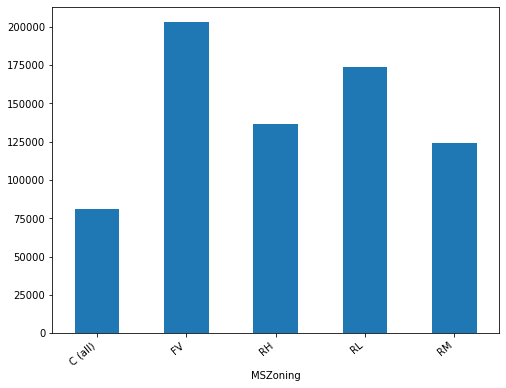

Pave    1164
Grvl       4
Name: Street, dtype: int64


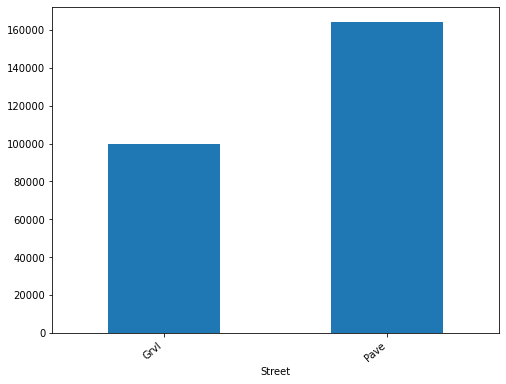

Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


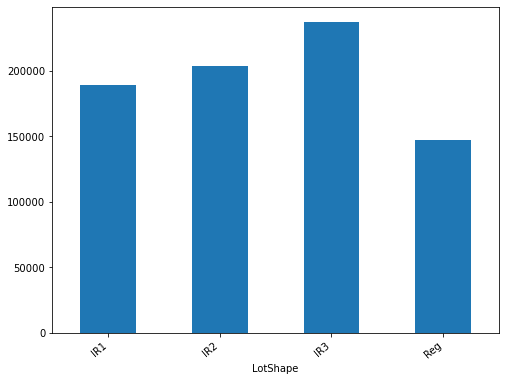

Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


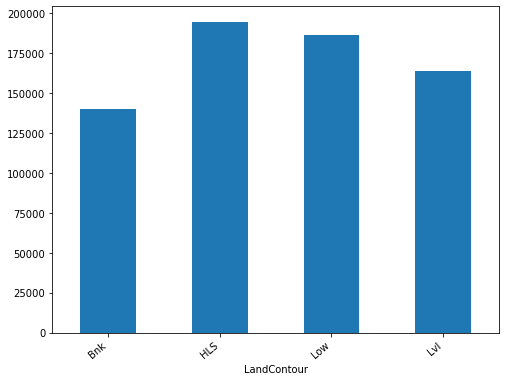

Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


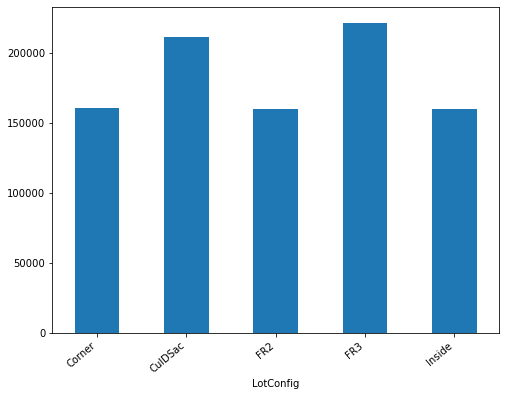

Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


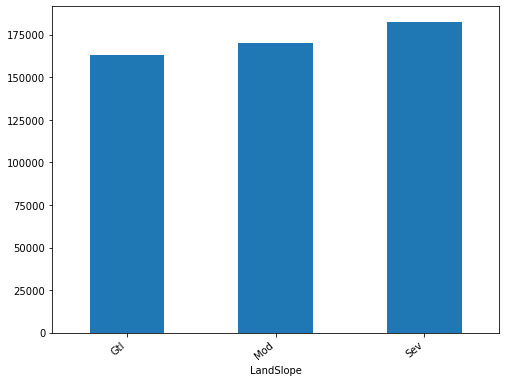

NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


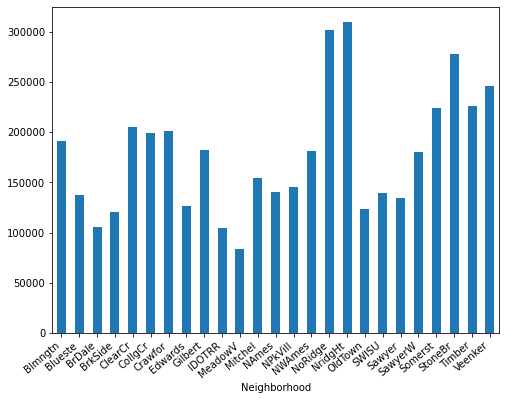

Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


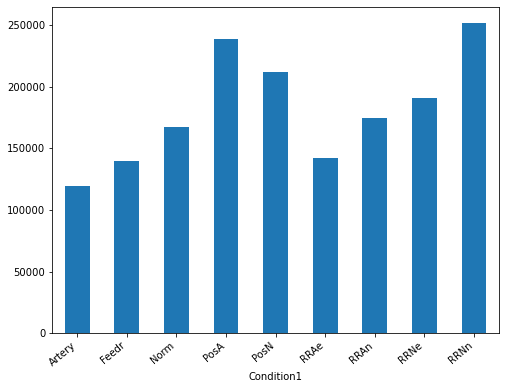

Norm      1154
Feedr        6
PosN         2
Artery       2
RRAe         1
RRNn         1
PosA         1
RRAn         1
Name: Condition2, dtype: int64


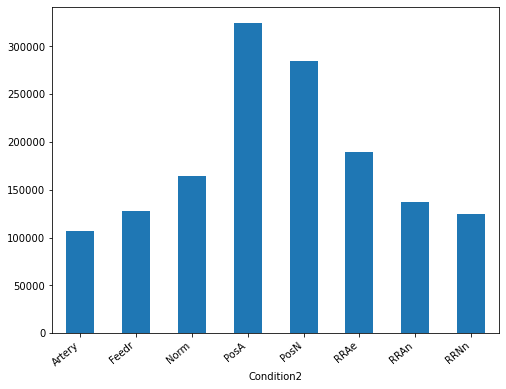

1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


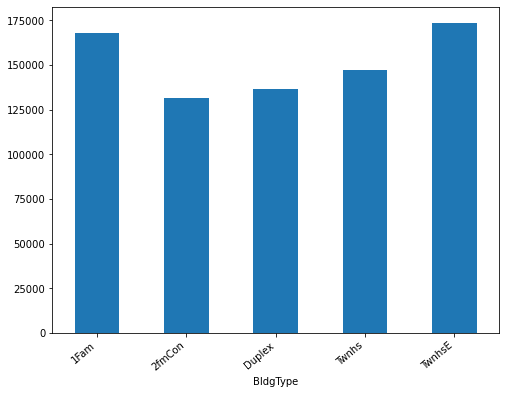

1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


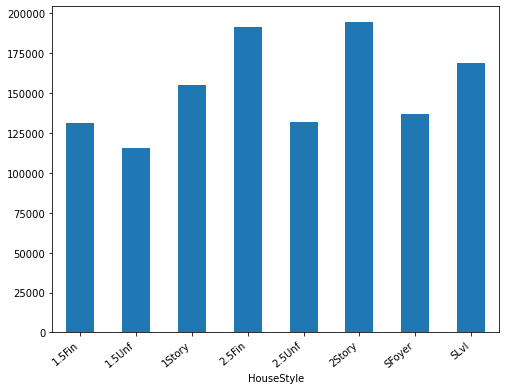

Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


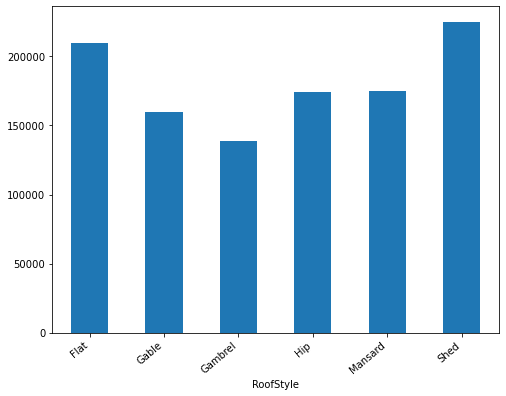

CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Roll          1
ClyTile       1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64


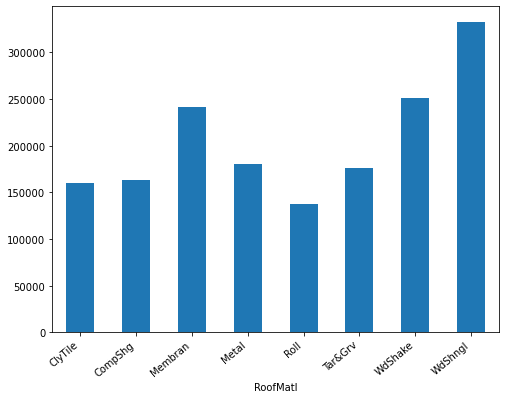

VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
AsphShn      1
ImStucc      1
BrkComm      1
Name: Exterior1st, dtype: int64


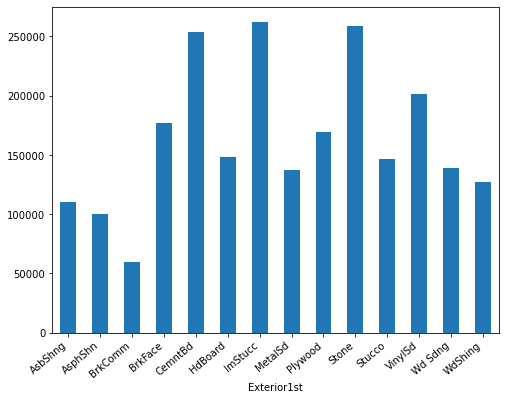

VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


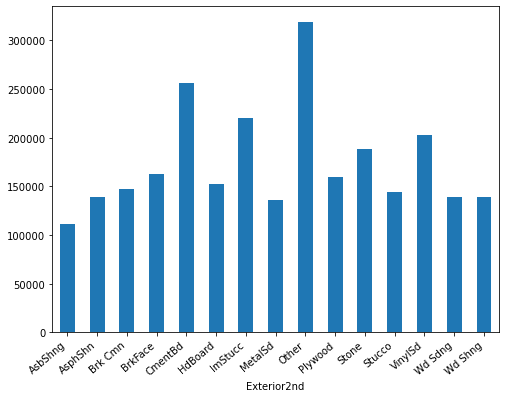

None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64


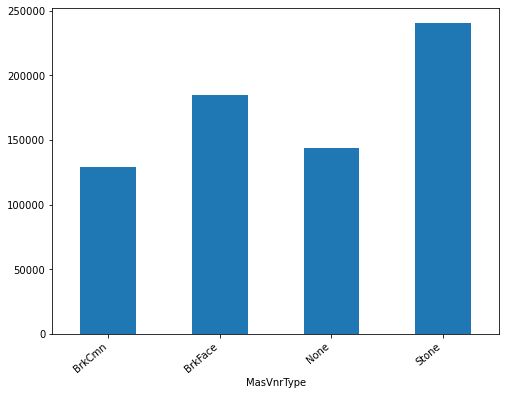

TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64


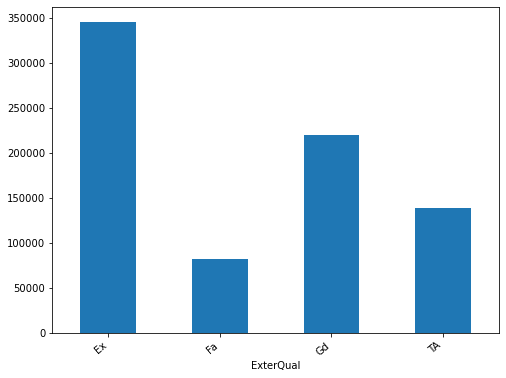

TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


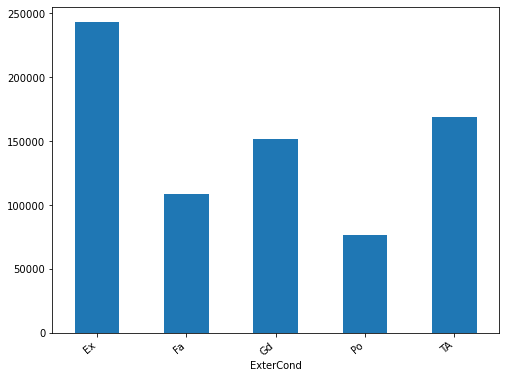

CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


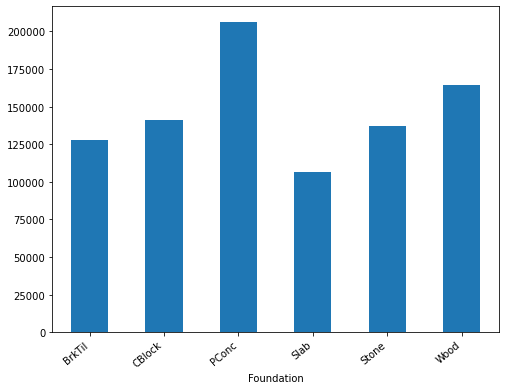

TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64


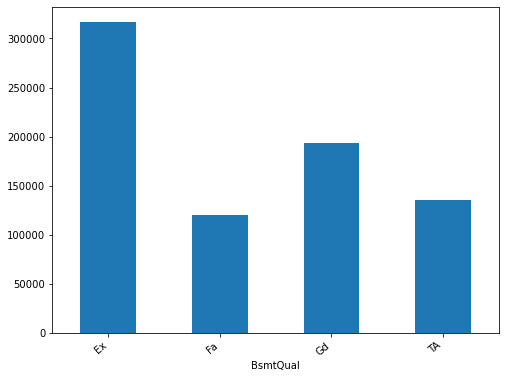

TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64


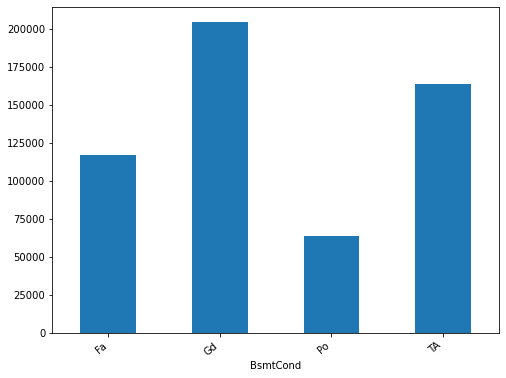

No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64


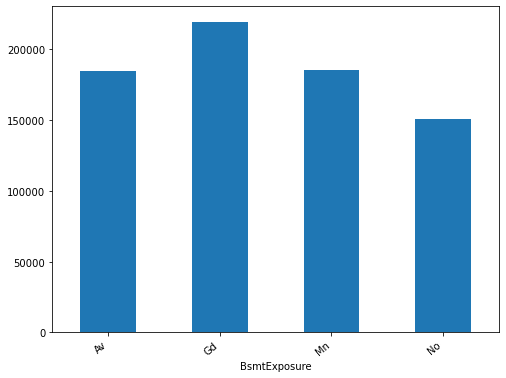

Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64


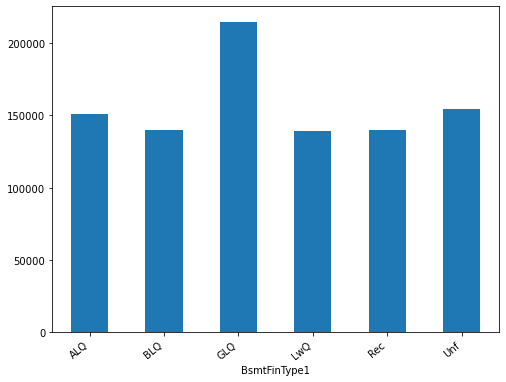

Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64


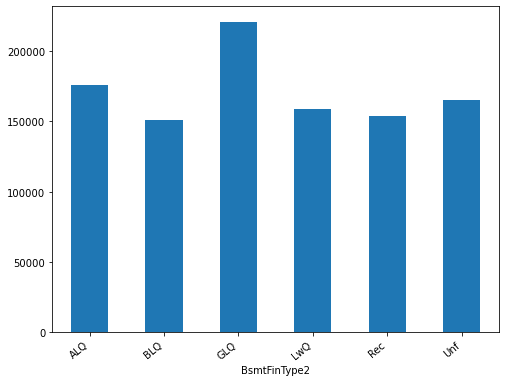

GasA     1143
GasW       14
Grav        5
Wall        4
Floor       1
OthW        1
Name: Heating, dtype: int64


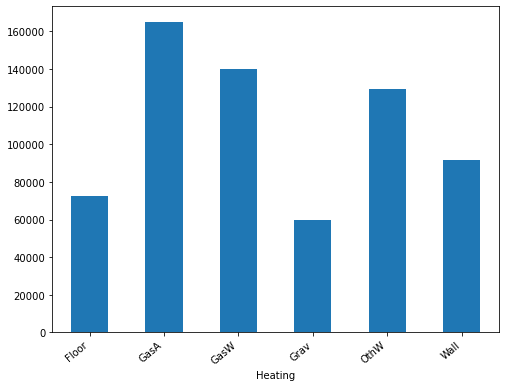

Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


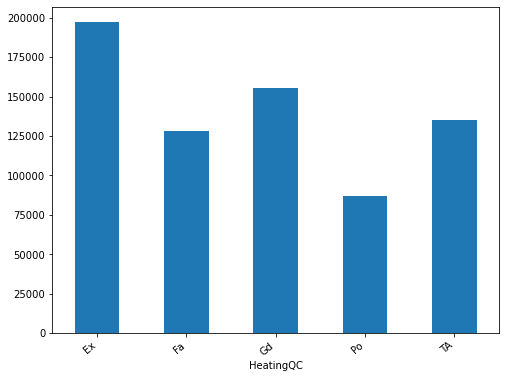

Y    1090
N      78
Name: CentralAir, dtype: int64


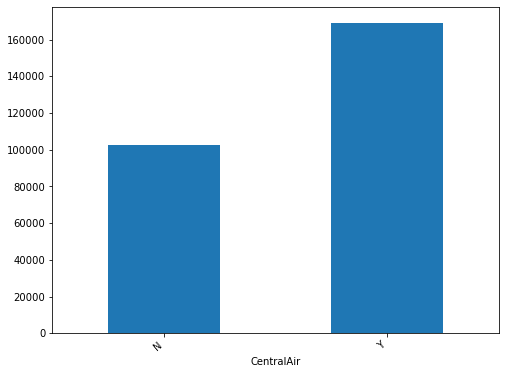

SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


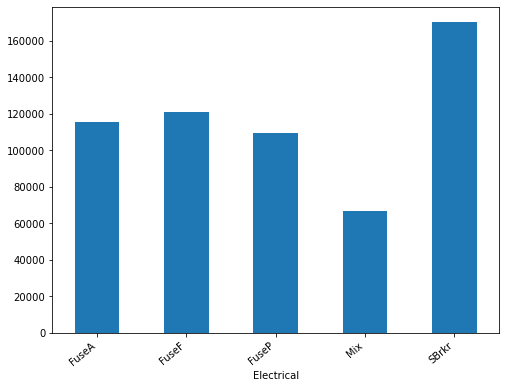

TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


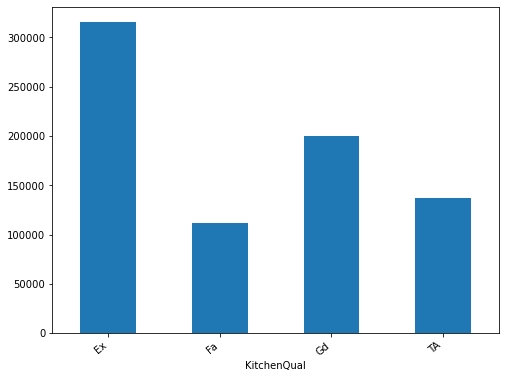

Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


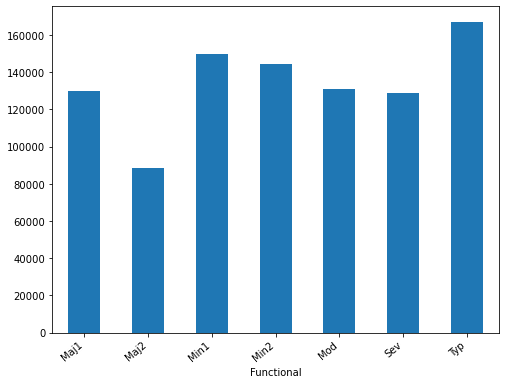

Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64


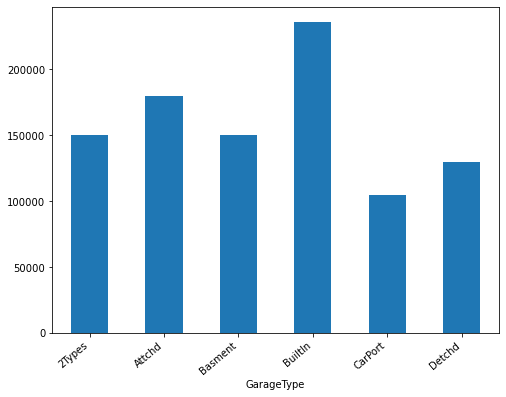

Unf    551
RFn    339
Fin    278
Name: GarageFinish, dtype: int64


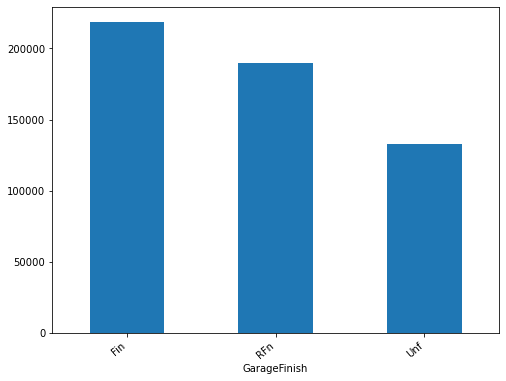

TA    1114
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64


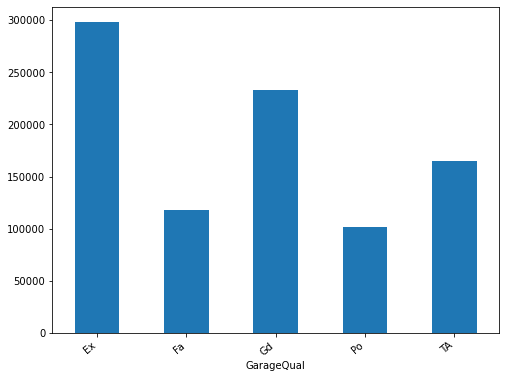

TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64


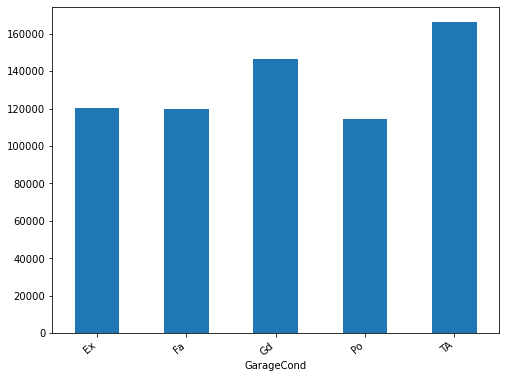

Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64


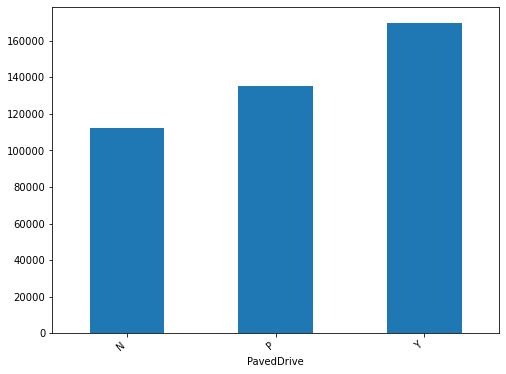

WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
Oth        3
CWD        3
Con        2
Name: SaleType, dtype: int64


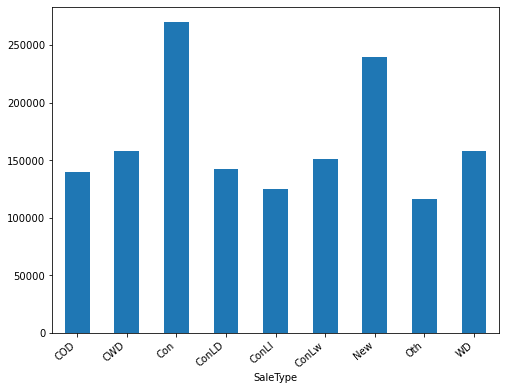

Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


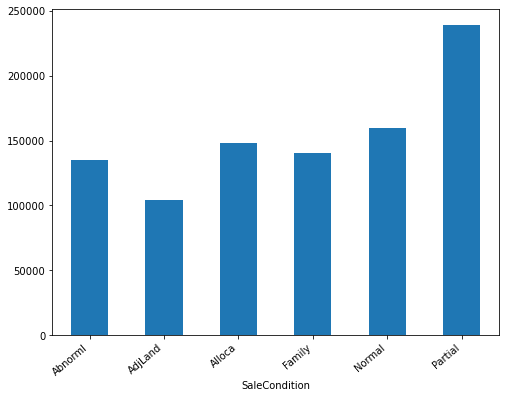

In [33]:
for i in cat_col:
    plt.figure(figsize=(8,6))
    #a=sns.countplot(train[i])
    a=train.groupby(i)['SalePrice'].median().plot.bar()
    print(train[i].value_counts())
    a.set_xticklabels(a.get_xticklabels(), rotation=40, ha="right")
    plt.show()

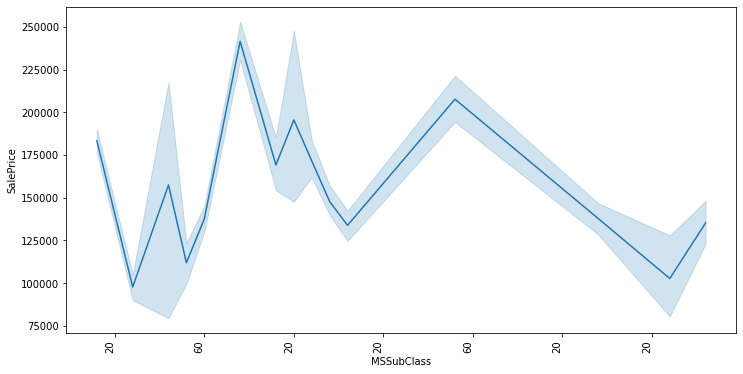

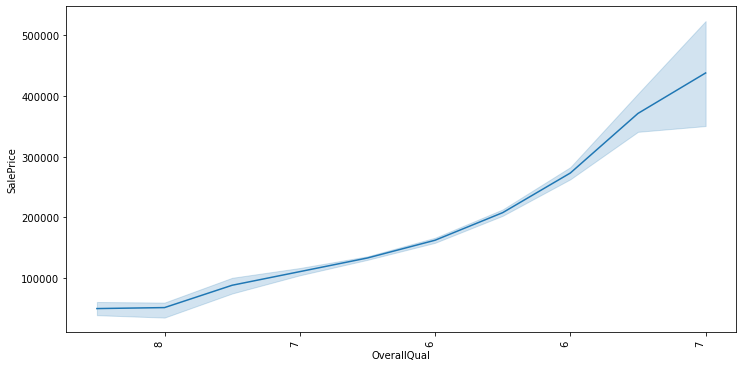

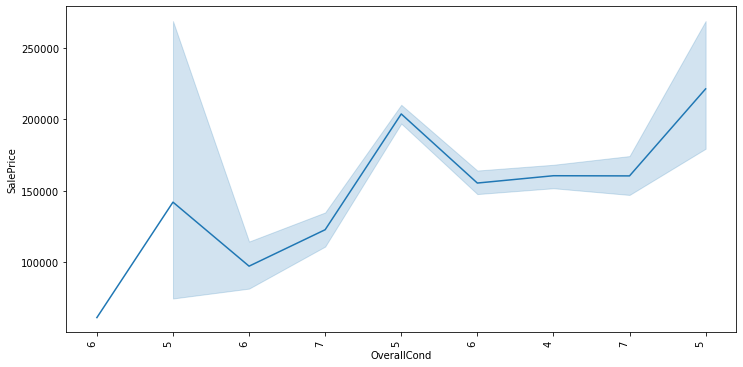

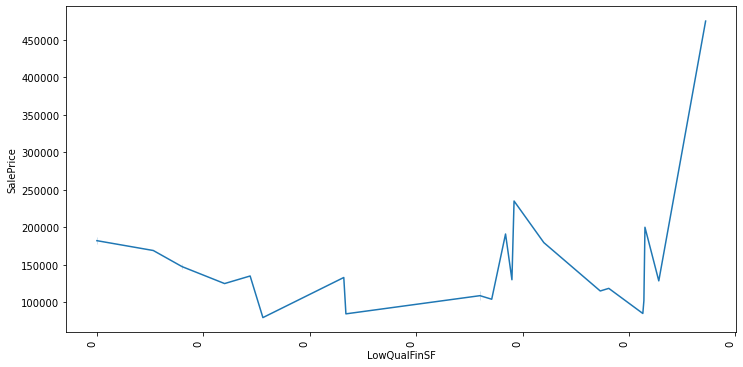

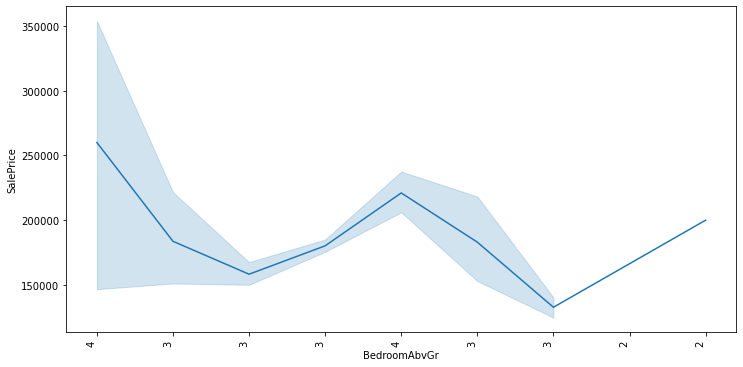

...

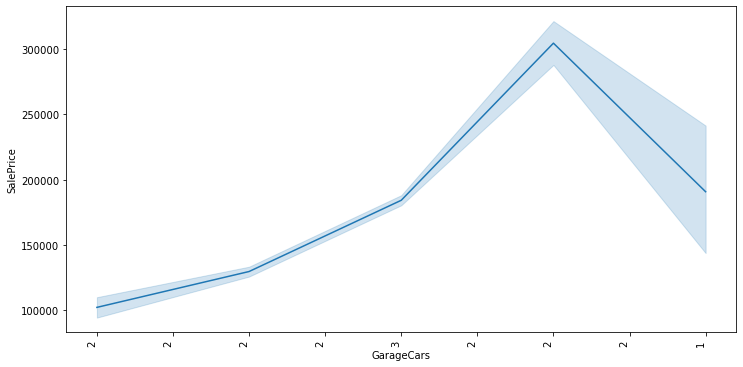

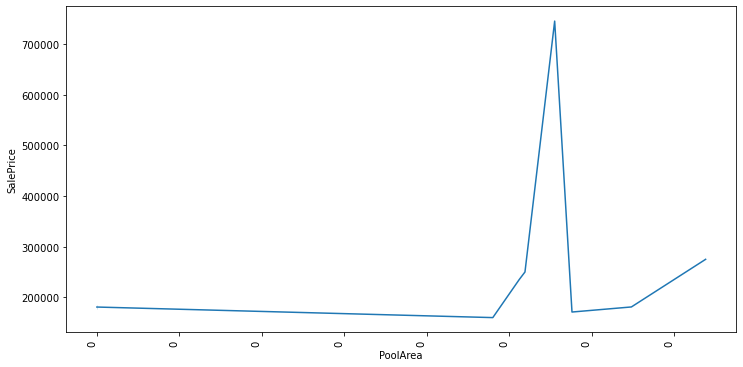

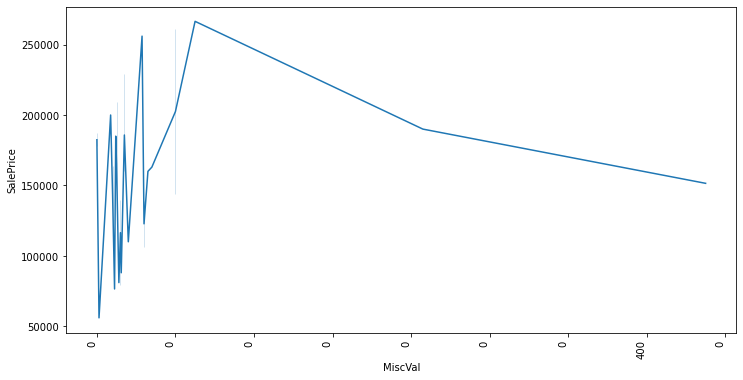

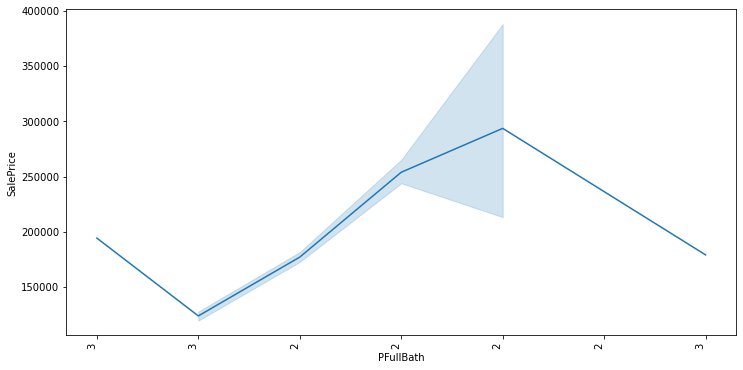

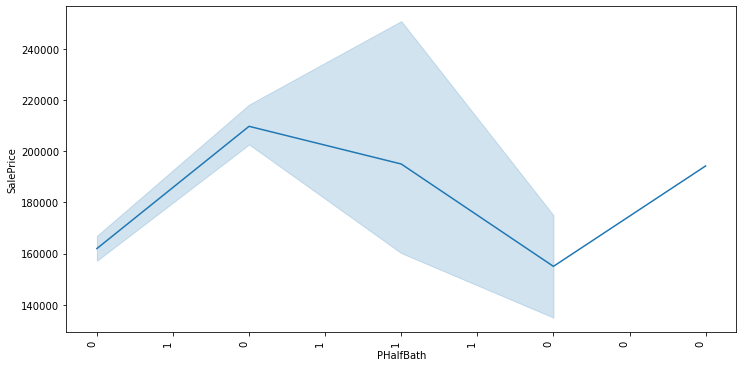

In [34]:
for i in dis_col:
    plt.figure(figsize=(12,6))
    a=sns.lineplot(x=train[i],y=train['SalePrice'],palette='Tableau')
    #a.set_xticklabels(a.get_xticklabels(), rotation=90, ha="right",visible=True)
    a.set_xticklabels(labels=train[i],rotation=90, ha="right")
    plt.show()

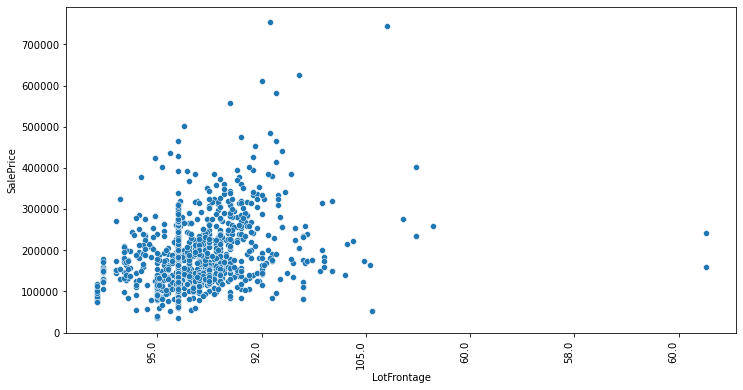

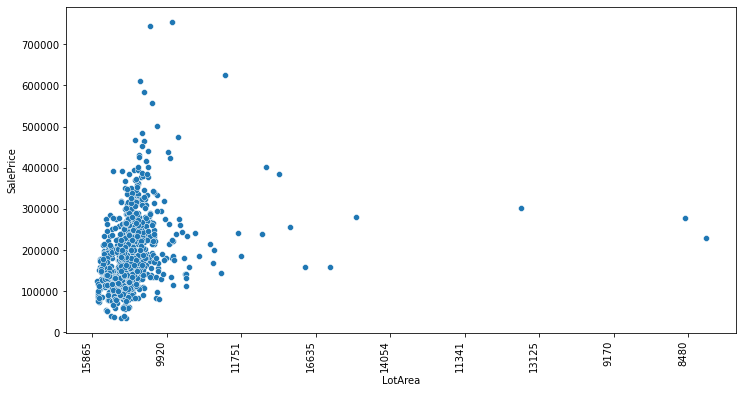

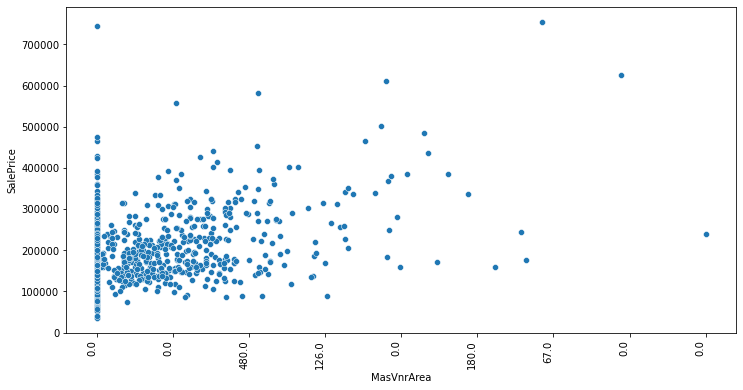

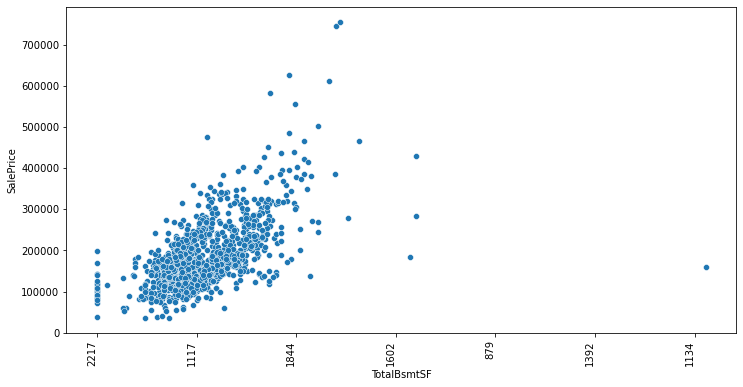

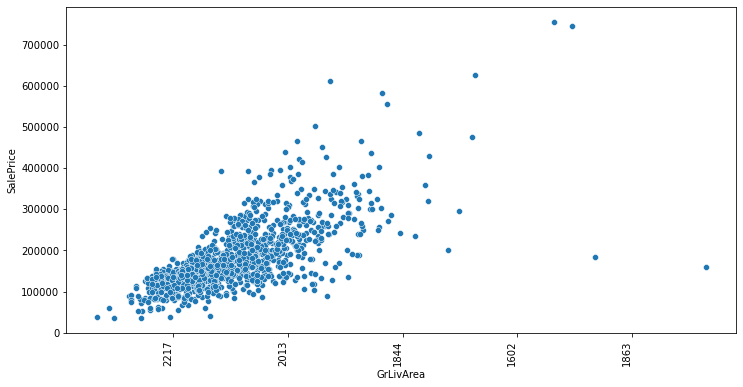

...

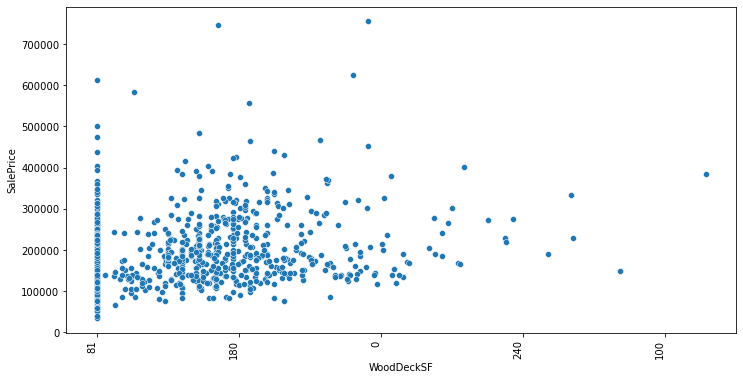

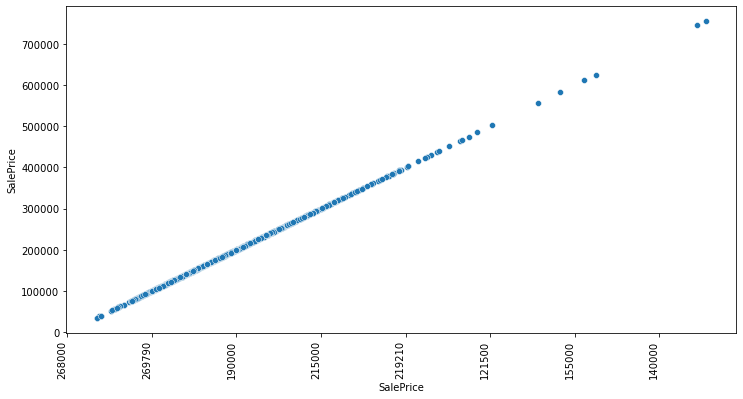

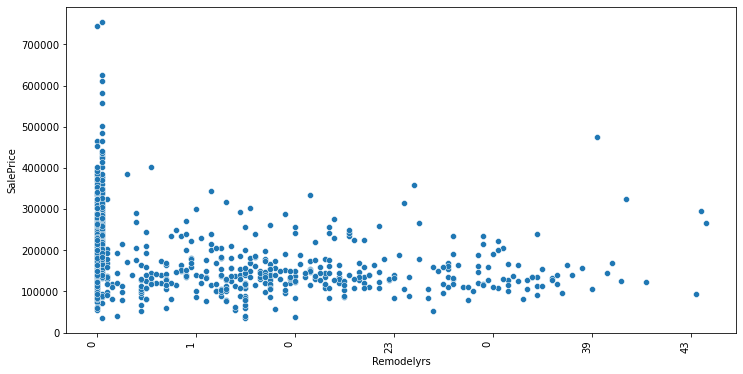

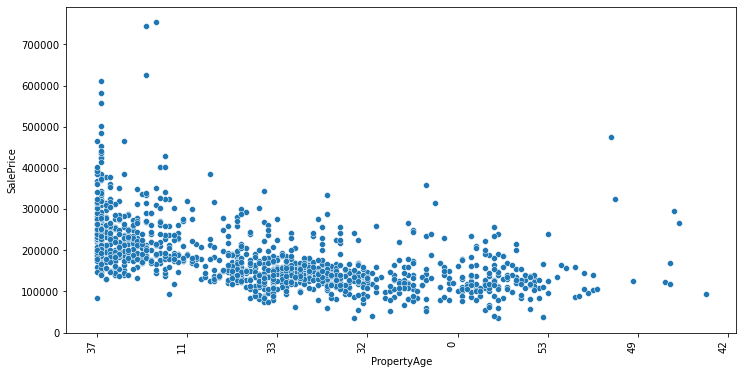

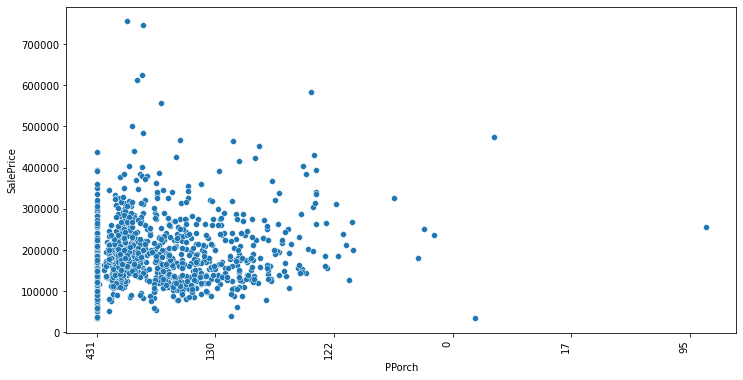

In [35]:
for i in con_col:
    plt.figure(figsize=(12,6))
    a=sns.scatterplot(x=train[i],y=train['SalePrice'],palette='Tableau')
    #a.set_xticklabels(a.get_xticklabels(), rotation=90, ha="right",visible=True)
    a.set_xticklabels(labels=train[i],rotation=90, ha="right")
    plt.show()

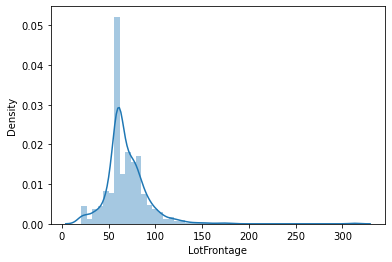

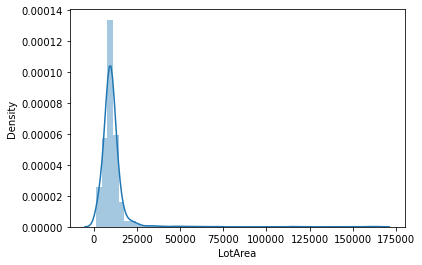

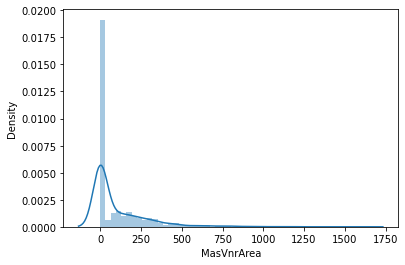

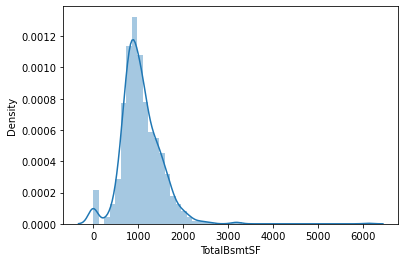

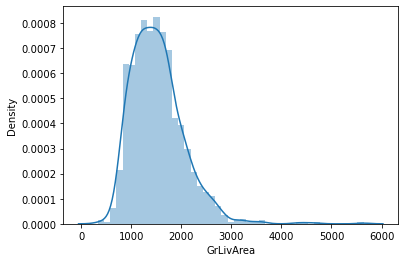

...

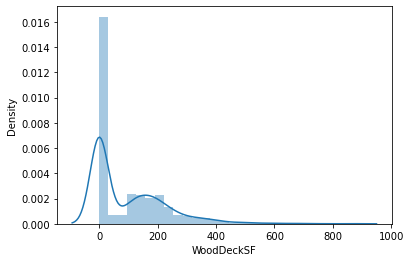

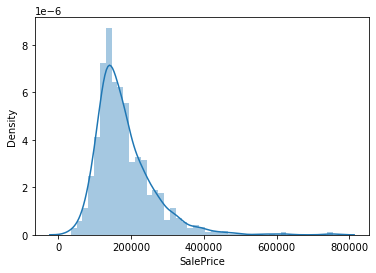

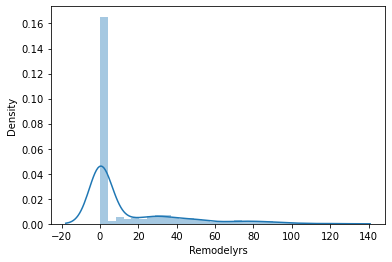

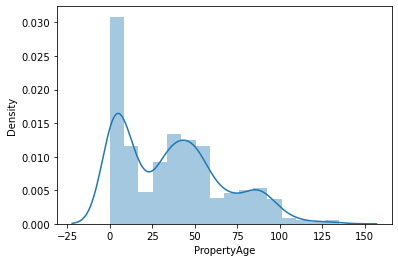

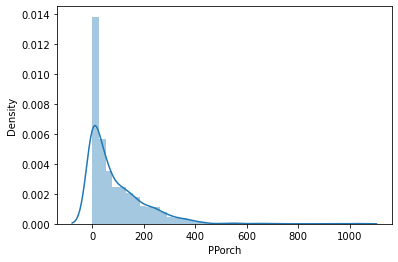

In [36]:
for i in con_col:
    plt.figure()
    sns.distplot(train[i],kde=True)

We can see for numerical columns data is not evenly distributed.

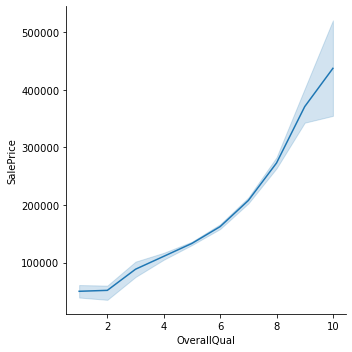

In [37]:
sns.relplot(x='OverallQual',y='SalePrice',data=train,kind='line')

We can see positive relation between overallQual and SalePrice.

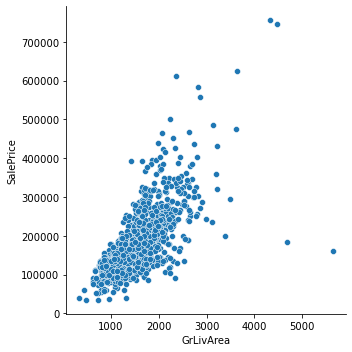

In [38]:
sns.relplot(x='GrLivArea',y='SalePrice',data=train,kind='scatter')

We can see positive relation between GrLivArea and SalePrice.

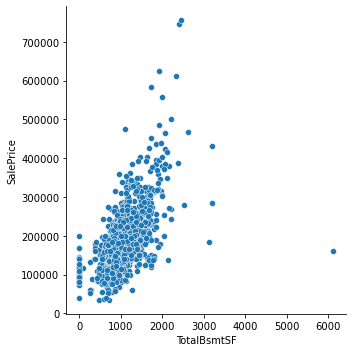

In [39]:
sns.relplot(x='TotalBsmtSF',y='SalePrice',data=train,kind='scatter')

We can see positive relation between TotalBsmtSF and SalePrice.

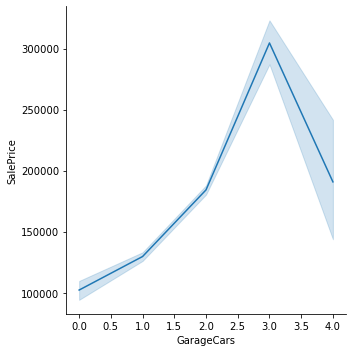

In [40]:
sns.relplot(x='GarageCars',y='SalePrice',data=train,kind='line')

We can see positive relation between GarageCars and SalePrice.

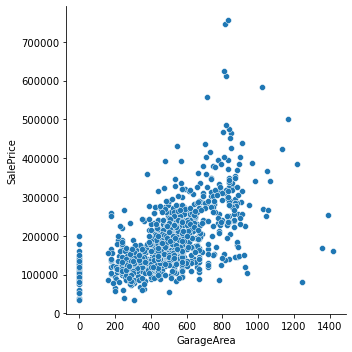

In [41]:
sns.relplot(x='GarageArea',y='SalePrice',data=train,kind='scatter')

We can see positive relation between GarageArea and SalePrice.

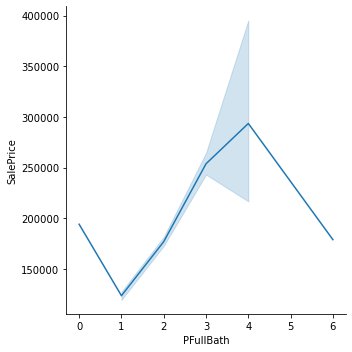

In [42]:
sns.relplot(x='PFullBath',y='SalePrice',data=train,kind='line')

We can see positive relation between PFullBath and SalePrice.

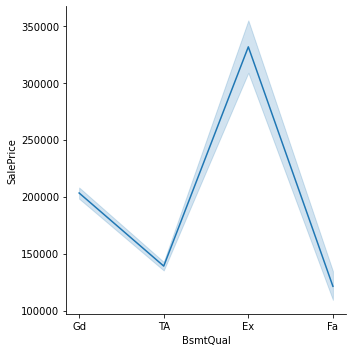

In [43]:
sns.relplot(x='BsmtQual',y='SalePrice',data=train,kind='line')

We can see negative relation between BsmtQual and SalePrice.

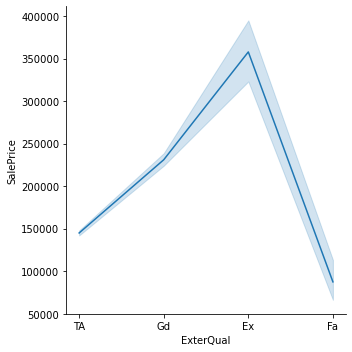

In [44]:
sns.relplot(x='ExterQual',y='SalePrice',data=train,kind='line')

We can see negative relation between ExterQual and SalePrice.

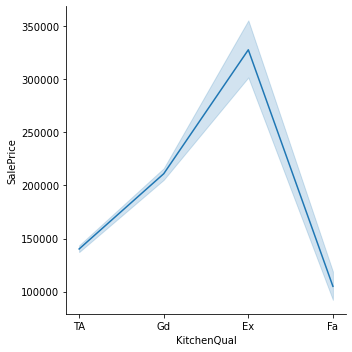

In [45]:
sns.relplot(x='KitchenQual',y='SalePrice',data=train,kind='line')

We can see negative relation between KitchenQual and SalePrice.

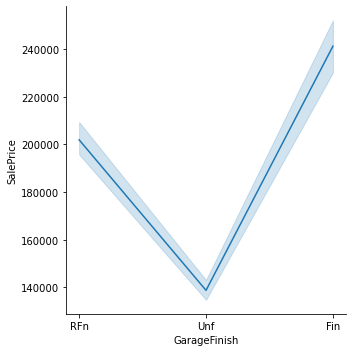

In [46]:
sns.relplot(x='GarageFinish',y='SalePrice',data=train,kind='line')

We can see negative relation between GarageFinish and SalePrice.

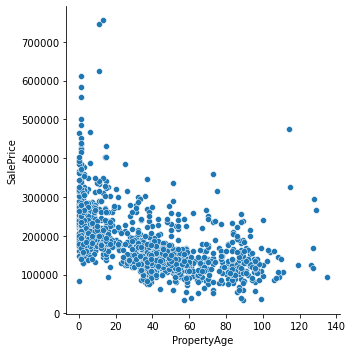

In [47]:
sns.relplot(x='PropertyAge',y='SalePrice',data=train,kind='scatter')

We can see negative relation between PropertyAge and SalePrice.

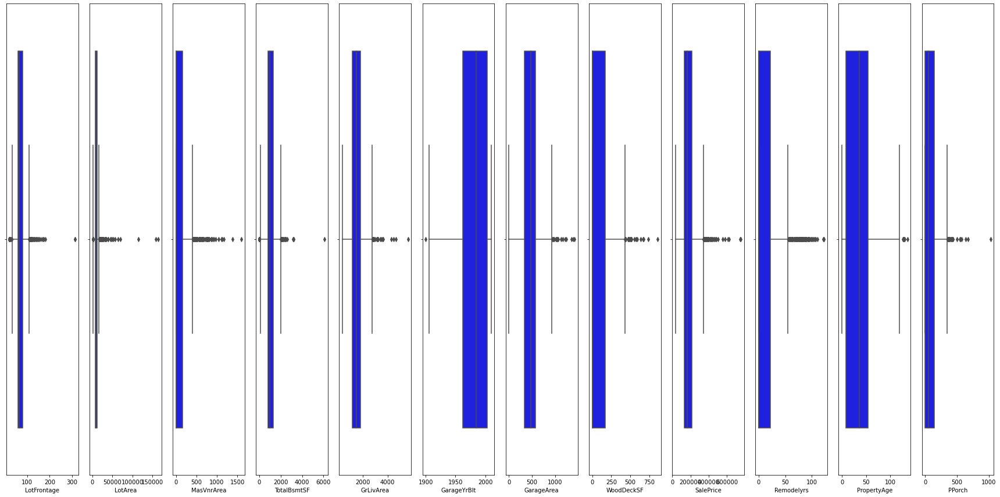

In [48]:
ncol=12
nrows=1
plt.figure(figsize=(2*ncol,1*ncol))
for i in range (0,len(con_col)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(train[con_col[i]],color='Blue',orient='v')
    plt.tight_layout()

We can see outliers in all numberical variables.

# Some functions for further analysis:

In [49]:
#below function will to detect outliers with the help IQR when feature has less/low skewness

def outlier_IQR_l(data_frame, feature_name):
    IQR=data_frame[feature_name].quantile(0.75) - data_frame[feature_name].quantile(0.25)
    lower_limit=data_frame[feature_name].quantile(0.25) - (IQR*1.5)
    upper_limit=data_frame[feature_name].quantile(0.75) + (IQR*1.5)
    return(lower_limit,upper_limit)

In [50]:
#below function will to detect outliers with the help IQR when feature has high skewness

def outlier_IQR_h(data_frame, feature_name):
    IQR=data_frame[feature_name].quantile(0.75) - data_frame[feature_name].quantile(0.25)
    lower_limit=data_frame[feature_name].quantile(0.25) - (IQR*3)
    upper_limit=data_frame[feature_name].quantile(0.75) + (IQR*3)
    return(lower_limit,upper_limit)

In [51]:
#below function will to detect outliers with the help of Zscore when feature data is distributed near to normal curve

def normaloutlier(data_frame, feature_name):
    lower_limit=data_frame[feature_name].mean() - 3 * data_frame[feature_name].std()
    upper_bridge=data_frame[feature_name].mean() + 3 * data_frame[feature_name].std()
    return(lower_limit,upper_limit)

In [52]:
# below function will help us to check skewness and distribution

def distribution(data_frame,feature_name):
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    stats.probplot(data_frame[feature_name],dist='norm',plot=pylab)
    plt.subplot(1,2,2)
    data_frame[feature_name].hist()
    plt.title("Distribution")

In [53]:
#Log transformation

def log_transform(data_frame,feature_name):
    data_frame_copy=data_frame.copy()
    if 0 in data_frame_copy[feature_name].unique():
        pass
    else:
        data_frame_copy[feature_name]=np.log(data_frame_copy[feature_name])
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        stats.probplot(data_frame_copy[feature_name],dist='norm',plot=pylab)
        plt.subplot(1,2,2)
        data_frame_copy[feature_name].hist()
        plt.title('log transformation')

In [54]:
#Reciprocal transformation

def reciprocal_transform(data_frame,feature_name):
    data_frame_copy=data_frame.copy()
    if 0 in data_frame_copy[feature_name].unique():
        pass
    else:
        data_frame_copy[feature_name]=1/data_frame_copy[feature_name]
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        stats.probplot(data_frame_copy[feature_name],dist='norm',plot=pylab)
        plt.subplot(1,2,2)
        data_frame_copy[feature_name].hist()
        plt.title('reciprocal transformation')

In [55]:
#Squareroot transformation

def sqaureroot_transform(data_frame,feature_name):
    data_frame_copy=data_frame.copy()
    if 0 in data_frame_copy[feature_name].unique():
        pass
    else:
        data_frame_copy[feature_name]=data_frame_copy[feature_name]**(1/2)
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        stats.probplot(data_frame_copy[feature_name],dist='norm',plot=pylab)
        plt.subplot(1,2,2)
        data_frame_copy[feature_name].hist()
        plt.title('Squareroot transformation')

In [56]:
#exponential transformation

def exponential_transform(data_frame,feature_name):
    data_frame_copy=data_frame.copy()
    if 0 in data_frame_copy[feature_name].unique():
        pass
    else:
        data_frame_copy[feature_name]=data_frame_copy[feature_name]**(1/1.2)
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        stats.probplot(data_frame_copy[feature_name],dist='norm',plot=pylab)
        plt.subplot(1,2,2)
        data_frame_copy[feature_name].hist()
        plt.title('exponential transformation')

In [57]:
#Boxcox transformation

def boxcox_transform(data_frame,feature_name):
    data_frame_copy=data_frame.copy()
    #data_frame_copy = data_frame_copy[data_frame_copy >= 0]
    if 0 in data_frame_copy[feature_name].unique():
        pass
    else:
        data_frame_copy[feature_name]=stats.boxcox(data_frame_copy[feature_name])
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        stats.probplot(data_frame_copy[feature_name],dist='norm',plot=pylab)
        plt.subplot(1,2,2)
        data_frame_copy[feature_name].hist()
        plt.title('Boxcox transformation')

# Let's Work on features individually

* LotFrontage

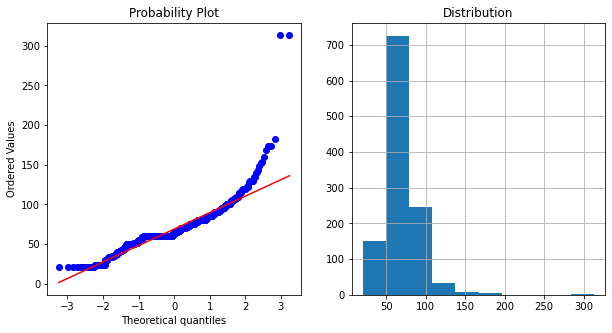

In [58]:
distribution(train,"LotFrontage")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [59]:
#We can see LotFrontage is less skewed hence i will go with IQR_h method
outlier_IQR_l(train,"LotFrontage")

(31.125, 108.125)

In [60]:
#changing values below lower limit
train.loc[train['LotFrontage']<= 31.125,'LotFrontage']=31.125
#changing values below upper limit
train.loc[train['LotFrontage']>= 108.125,'LotFrontage']=108.125

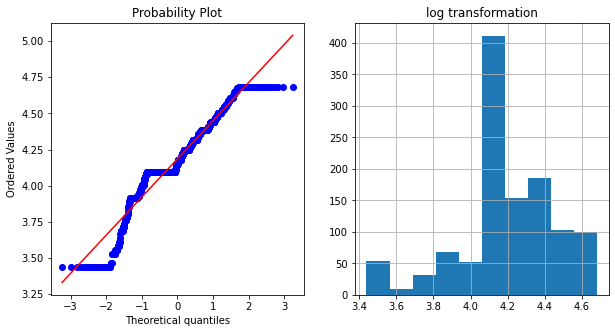

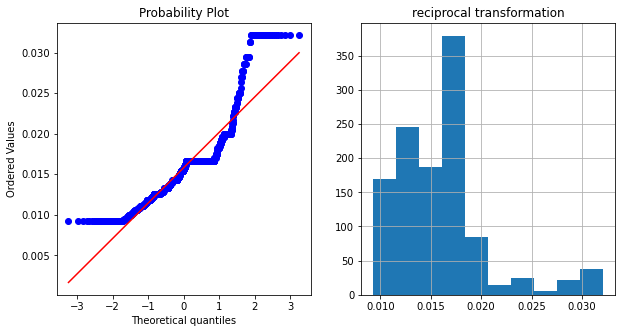

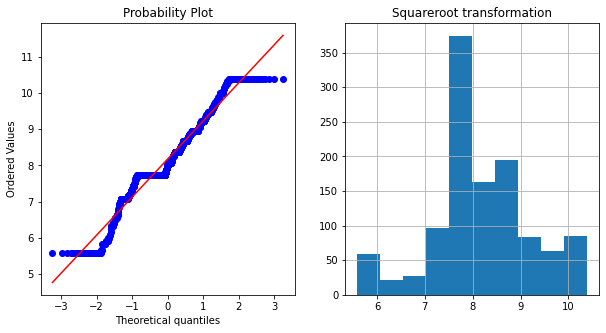

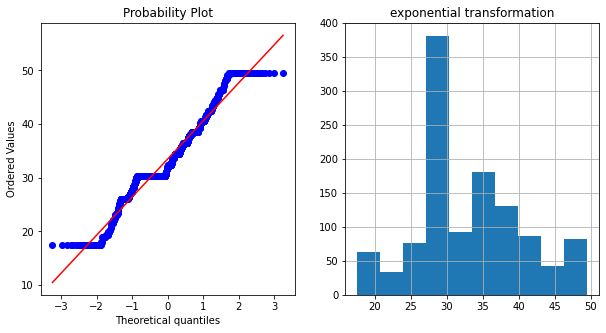

In [61]:
#Apply some transformation technique on LotFrontage for make distribution as normally distribution and check distribution by QQ plot

log_transform(train,"LotFrontage")
reciprocal_transform(train,"LotFrontage")
sqaureroot_transform(train,"LotFrontage")
exponential_transform(train,"LotFrontage")
for i in train.LotFrontage:
    if i > 0:
        break
    else:
        boxcox_transform(train,"LotFrontage")

In [62]:
# Apply exponential transformation on LotFrontage feature
if 0 in train['LotFrontage'].unique():
    pass
else:
    train['LotFrontage']=train['LotFrontage']**(1/1.2)

* LotArea

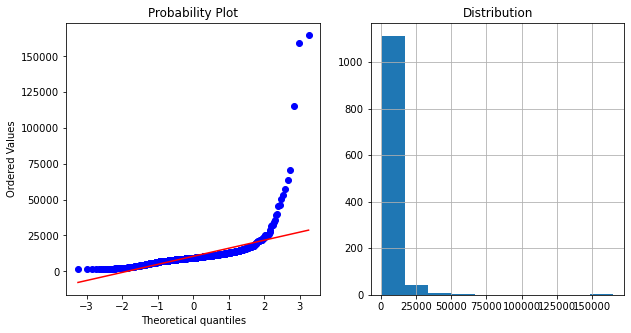

In [63]:
distribution(train,"LotArea")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [64]:
#We can see LotArea is highly skewed hence i will go with IQR_h method
outlier_IQR_h(train,"LotArea")

(-4060.5, 23197.5)

In [65]:
#changing values below lower limit
train.loc[train['LotArea']<= -4060.5,'LotArea']=-4060.5
#changing values below upper limit
train.loc[train['LotArea']>= 23197.5,'LotArea']=23197.5

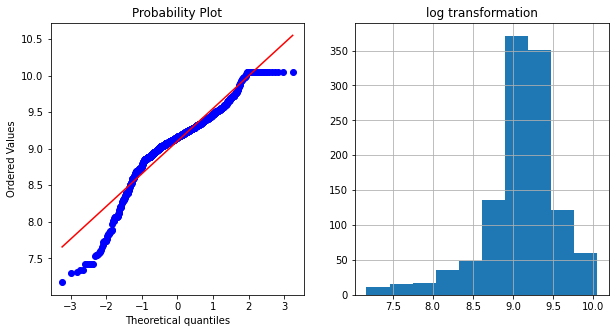

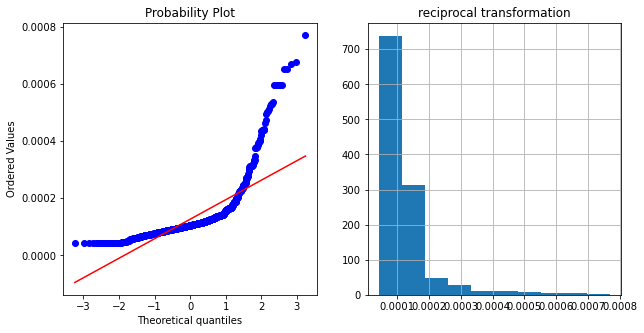

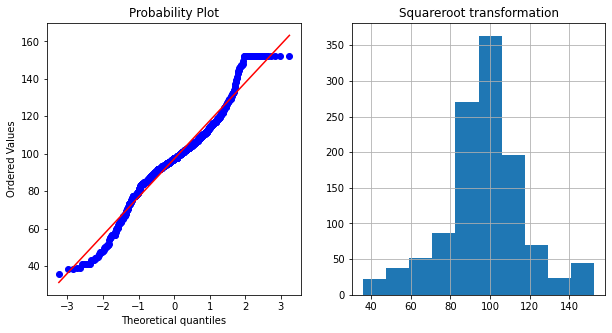

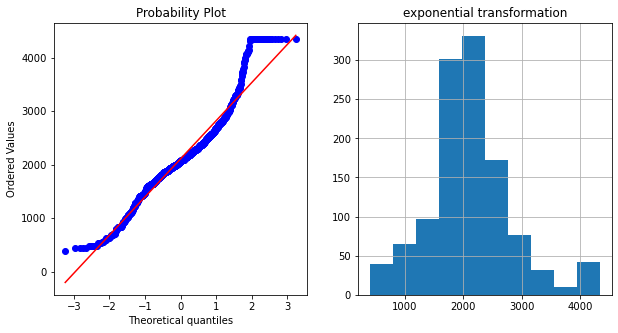

In [66]:
#Apply some transformation technique on LotArea for make distribution as normally distribution and check distribution by QQ plot

log_transform(train,"LotArea")
reciprocal_transform(train,"LotArea")
sqaureroot_transform(train,"LotArea")
exponential_transform(train,"LotArea")
for i in train.LotArea:
    if i > 0:
        break
    else:
        boxcox_transform(train,"LotArea")

In [67]:
# Apply squareroot transformation on LotArea feature
if 0 in train['LotArea'].unique():
    pass
else:
    train['LotArea']=train['LotArea']**(1/2)

* MasVnrArea

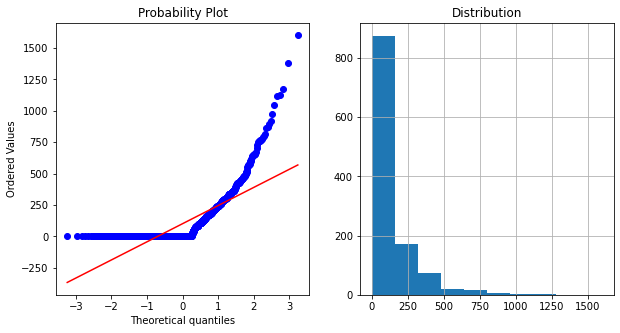

In [68]:
distribution(train,"MasVnrArea")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [69]:
#We can see MasVnrArea is highly skewed hence i will go with IQR_h method
outlier_IQR_h(train,"MasVnrArea")

(-480.0, 640.0)

In [70]:
#changing values below lower limit
train.loc[train['MasVnrArea']<= -480.0,'MasVnrArea']=-480.0
#changing values below upper limit
train.loc[train['MasVnrArea']>= 640.0,'MasVnrArea']=640.0

Transformation functions are  not working for MasVnrArea columns.

* TotalBsmtSF

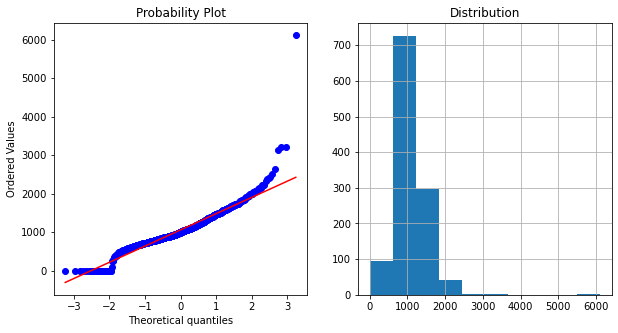

In [71]:
distribution(train,"TotalBsmtSF")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [72]:
#We can see TotalBsmtSF is highly skewed hence i will go with IQR_h method
outlier_IQR_h(train,"TotalBsmtSF")

(-678.5, 2769.0)

In [73]:
#changing values below lower limit
train.loc[train['TotalBsmtSF']<= -678.5,'TotalBsmtSF']=-678.5
#changing values below upper limit
train.loc[train['TotalBsmtSF']>= 2769.0,'TotalBsmtSF']=2769.0

Transformation functions are  not working for TotalBsmtSF columns.

* GrLivArea

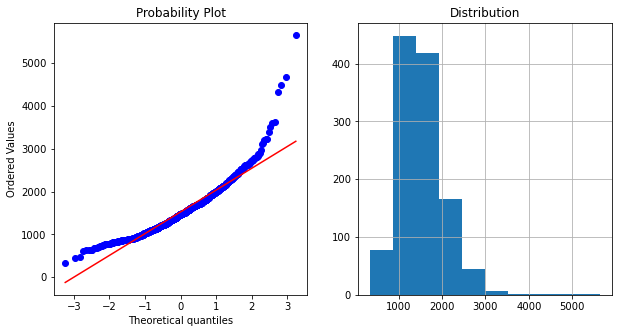

In [74]:
distribution(train,"GrLivArea")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [75]:
#We can see GrLivArea is highly skewed hence i will go with IQR_h method
outlier_IQR_h(train,"GrLivArea")

(-812.0, 3750.25)

In [76]:
#changing values below lower limit
train.loc[train['GrLivArea']<= -812.0,'GrLivArea']=-812.0
#changing values below upper limit
train.loc[train['GrLivArea']>= 3750.25,'GrLivArea']=3750.25

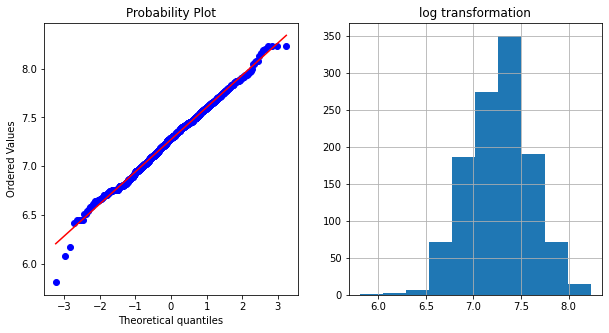

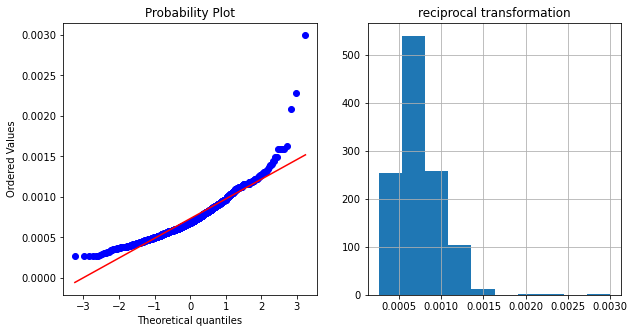

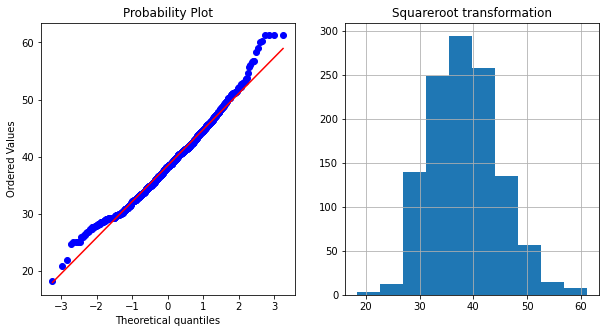

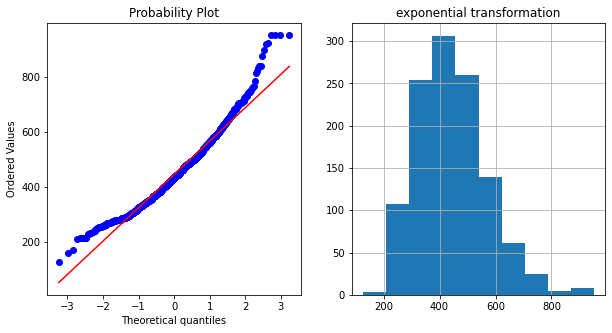

In [77]:
#Apply some transformation technique on GrLivArea for make distribution as normally distribution and check distribution by QQ plot

log_transform(train,"GrLivArea")
reciprocal_transform(train,"GrLivArea")
sqaureroot_transform(train,"GrLivArea")
exponential_transform(train,"GrLivArea")
for i in train.GrLivArea:
    if i > 0:
        break
    else:
        boxcox_transform(train,"GrLivArea")

In [78]:
# Apply squareroot transformation on GrLivArea feature
if 0 in train['GrLivArea'].unique():
    pass
else:
    train['GrLivArea']=train['GrLivArea']**(1/2)

* GarageYrBlt

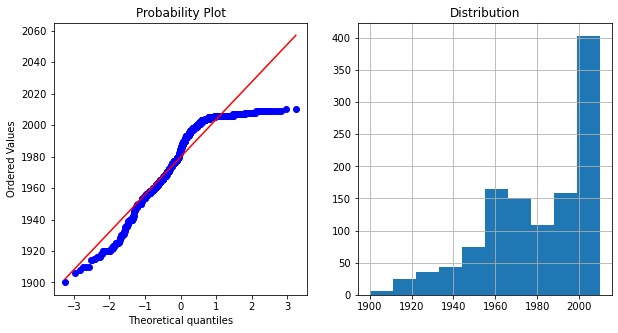

In [79]:
distribution(train,"GarageYrBlt")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [80]:
#We can see GarageYrBlt is less skewed hence i will go with IQR_h method
outlier_IQR_l(train,"GarageYrBlt")

(1900.5, 2064.5)

In [81]:
#changing values below lower limit
train.loc[train['GarageYrBlt']<= 1900.5,'GarageYrBlt']=1900.5
#changing values below upper limit
train.loc[train['GarageYrBlt']>= 2064.5,'GarageYrBlt']=2064.5

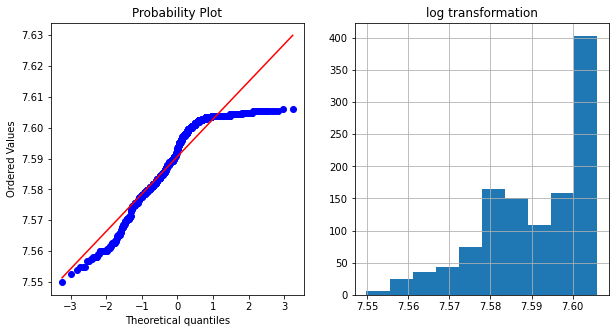

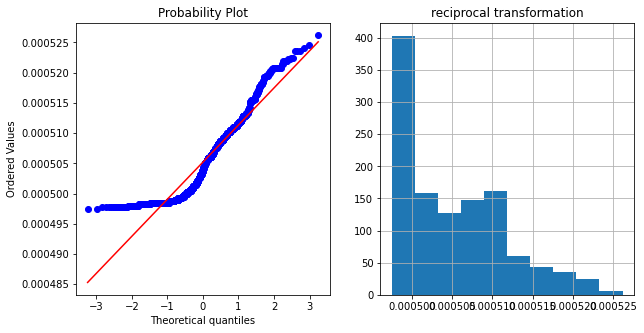

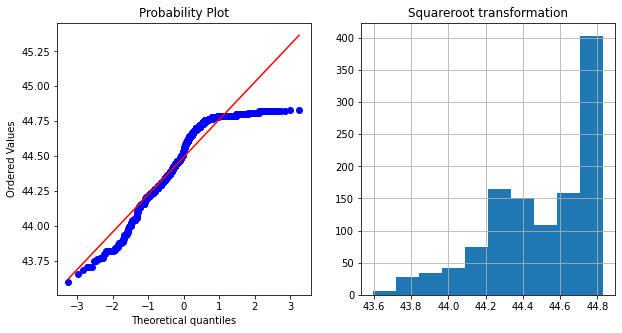

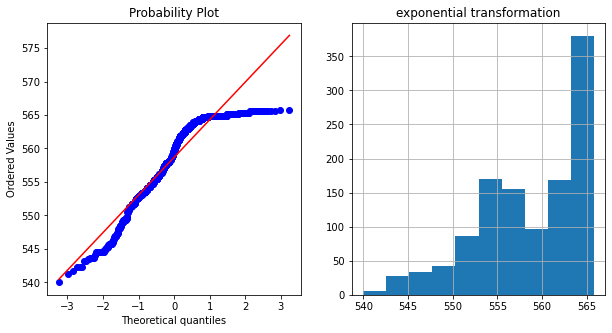

In [82]:
#Apply some transformation technique on GarageYrBlt for make distribution as normally distribution and check distribution by QQ plot

log_transform(train,"GarageYrBlt")
reciprocal_transform(train,"GarageYrBlt")
sqaureroot_transform(train,"GarageYrBlt")
exponential_transform(train,"GarageYrBlt")
for i in train.GarageYrBlt:
    if i > 0:
        break
    else:
        boxcox_transform(train,"GarageYrBlt")

In [83]:
# Apply squareroot transformation on GarageYrBlt feature
if 0 in train['GarageYrBlt'].unique():
    pass
else:
    train['GarageYrBlt']=train['GarageYrBlt']**(1/2)

* GarageArea

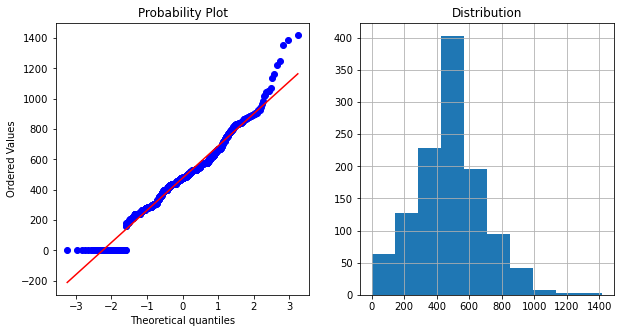

In [84]:
distribution(train,"GarageArea")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [85]:
#We can see GarageArea is less skewed hence i will go with IQR_h method
outlier_IQR_l(train,"GarageArea")

(-19.0, 933.0)

In [86]:
#changing values below lower limit
train.loc[train['GarageArea']<= -19.0,'GarageArea']=-19.0
#changing values below upper limit
train.loc[train['GarageArea']>= 933.0,'GarageArea']=933.0

Transformation functions are  not working for GarageArea columns.

* WoodDeckSF

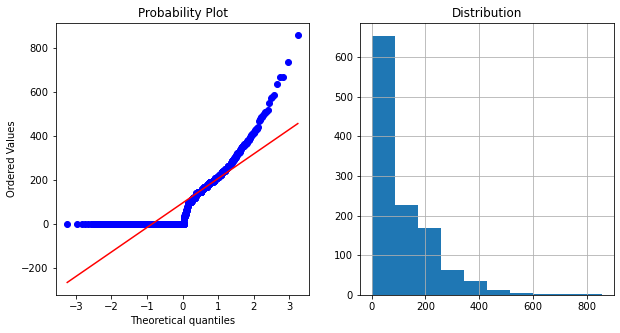

In [87]:
distribution(train,"WoodDeckSF")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [88]:
#We can see WoodDeckSF is highly skewed hence i will go with IQR_h method
outlier_IQR_h(train,"WoodDeckSF")

(-513.0, 684.0)

In [89]:
#changing values below lower limit
train.loc[train['WoodDeckSF']<= -513.0,'WoodDeckSF']=-513.0
#changing values below upper limit
train.loc[train['WoodDeckSF']>= 684.0,'WoodDeckSF']=684.0

Transformation functions are  not working for WoodDeckSF columns.

* Remodelyrs

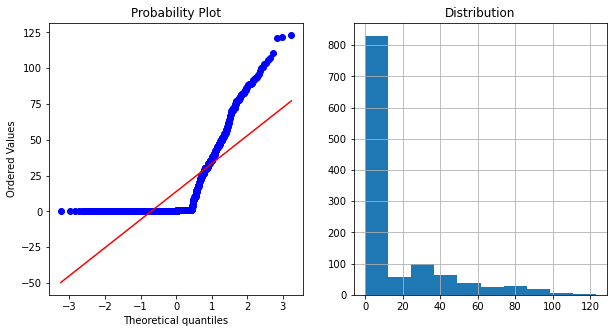

In [90]:
distribution(train,"Remodelyrs")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [91]:
#We can see Remodelyrs is highly skewed hence i will go with IQR_h method
outlier_IQR_h(train,"Remodelyrs")

(-66.0, 88.0)

In [92]:
#changing values below lower limit
train.loc[train['Remodelyrs']<= -66.0,'Remodelyrs']=-66.0
#changing values below upper limit
train.loc[train['Remodelyrs']>= 88.0,'Remodelyrs']=88.0

Transformation functions are  not working for Remodelyrs columns.

* PropertyAge

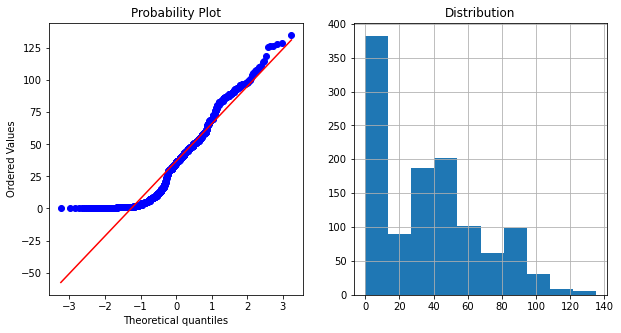

In [93]:
distribution(train,"PropertyAge")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [94]:
#We can see PropertyAge is highly skewed hence i will go with IQR_h method
outlier_IQR_h(train,"PropertyAge")

(-130.0, 192.0)

In [95]:
#changing values below lower limit
train.loc[train['PropertyAge']<= -130.0,'PropertyAge']=-130.0
#changing values below upper limit
train.loc[train['PropertyAge']>= 192.0,'PropertyAge']=192.0

Transformation functions are  not working for PropertyAge columns.

* PPorch

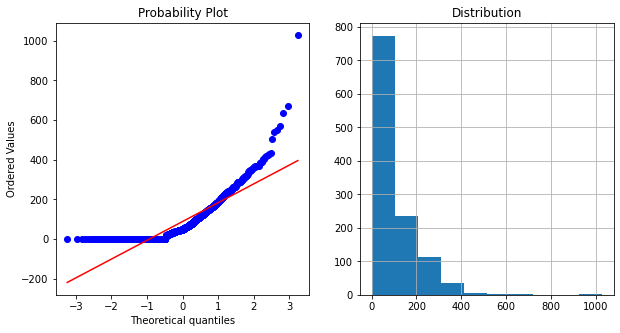

In [96]:
distribution(train,"PPorch")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [97]:
#We can see PPorch is highly skewed hence i will go with IQR_h method
outlier_IQR_h(train,"PPorch")

(-420.0, 560.0)

In [98]:
#changing values below lower limit
train.loc[train['PPorch']<= -420.0,'PPorch']=-420.0
#changing values below upper limit
train.loc[train['PPorch']>= 560.0,'PPorch']=560.0

Transformation functions are  not working for PPorch columns.

# Let's look at the correlation:

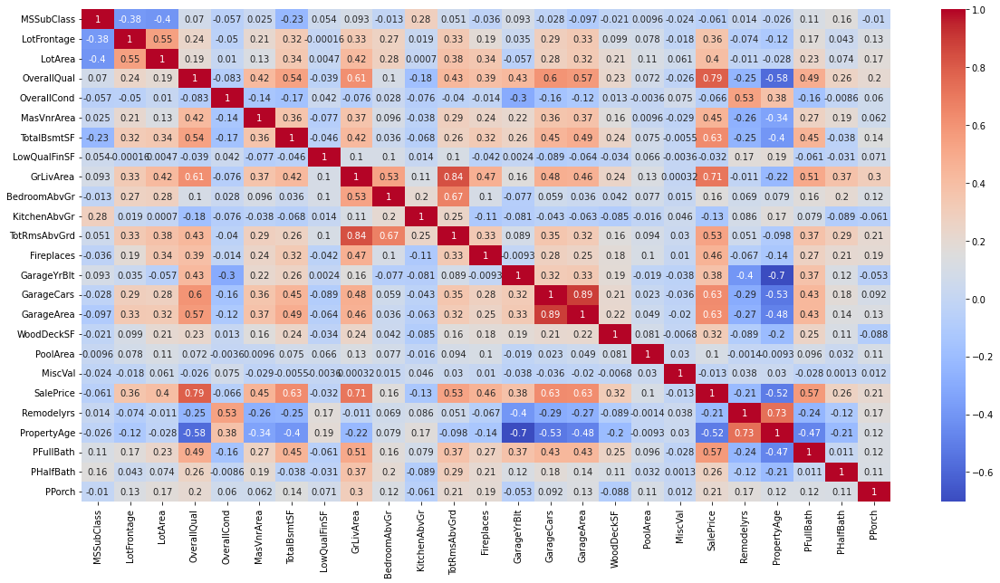

In [99]:
plt.figure(figsize=(20,10))
sns.heatmap(train.corr(),annot=True,cmap='coolwarm')
plt.show()

We need to check the correlation of all columns with or target column 'SalePrice' however where datatype of columns is Object hence we cannot see those columns.

Let's change the data type of other object type columns.

In [100]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()

for i in cat_col:
    train[i]=oe.fit_transform(train[i].values.reshape(-1,1))

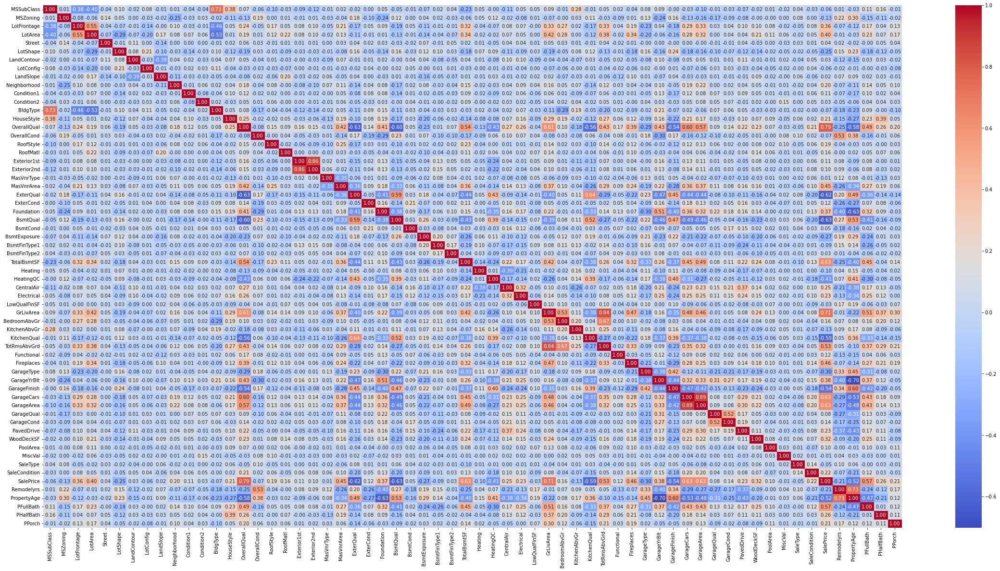

In [101]:
plt.figure(figsize=(40,20))
sns.heatmap(train.corr(),annot=True,cmap='coolwarm', fmt='0.2f')
plt.show()

In [102]:
cor_matrix=train.corr()
cor_matrix['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.789185
GrLivArea        0.711756
TotalBsmtSF      0.632095
GarageCars       0.628329
GarageArea       0.627558
PFullBath        0.569913
TotRmsAbvGrd     0.528363
Fireplaces       0.459611
MasVnrArea       0.452342
LotArea          0.398307
GarageYrBlt      0.381519
Foundation       0.374169
LotFrontage      0.356355
WoodDeckSF       0.315104
PHalfBath        0.263850
CentralAir       0.246754
Electrical       0.234621
PavedDrive       0.231707
SaleCondition    0.217687
PPorch           0.214272
HouseStyle       0.205502
Neighborhood     0.198942
RoofStyle        0.192654
RoofMatl         0.159865
BedroomAbvGr     0.158281
GarageCond       0.135071
Functional       0.118673
ExterCond        0.115167
Exterior1st      0.108451
Condition1       0.105820
PoolArea         0.103280
Exterior2nd      0.097541
GarageQual       0.080795
BsmtCond         0.048125
Street           0.044753
Condition2       0.033956
LandContour      0.032836
BsmtFinType2

In [103]:
a=['BsmtCond','Street','Condition2','LandContour','BsmtFinType2','LandSlope','MasVnrType','MiscVal','LowQualFinSF']
train.drop(a, axis=1, inplace=True)

# Skewness and outliers removal:

We have already delt with outliers.

In [104]:
train.skew()

MSSubClass        1.422019
MSZoning         -1.796785
LotFrontage       0.213362
LotArea           0.002794
LotShape         -0.603775
LotConfig        -1.118821
Neighborhood      0.043735
Condition1        3.008289
BldgType          2.318657
HouseStyle        0.285680
OverallQual       0.175082
OverallCond       0.580714
RoofStyle         1.498560
RoofMatl          7.577352
Exterior1st      -0.612816
Exterior2nd      -0.592349
MasVnrArea        1.835781
ExterQual        -1.810843
ExterCond        -2.516219
Foundation       -0.002761
BsmtQual         -1.343781
BsmtExposure     -1.166987
BsmtFinType1     -0.068901
TotalBsmtSF       0.490197
Heating          10.103609
HeatingQC         0.449933
CentralAir       -3.475188
Electrical       -3.104209
GrLivArea         0.432837
BedroomAbvGr      0.243855
KitchenAbvGr      4.365259
KitchenQual      -1.408106
TotRmsAbvGrd      0.644657
Functional       -3.999663
Fireplaces        0.671966
GarageType        0.831142
GarageYrBlt      -0.718455
G

We do not consider skewness for target variable sales price and categorical and discrete variables. 

In [105]:
for i in con_col:
    if -0.5 < skew(train[i]) > 0.5:
        print(i,"variables skewness is ", skew(train[i]))
    elif skew(train[i]) < -0.5:
        print(i,"variables skewness is ", skew(train[i]))

MasVnrArea variables skewness is  1.8334221228605143
GarageYrBlt variables skewness is  -0.7175319982452714
WoodDeckSF variables skewness is  1.4149221187403154
SalePrice variables skewness is  1.951367548938153
Remodelyrs variables skewness is  1.7743984679122782
PropertyAge variables skewness is  0.5723909942436998
PPorch variables skewness is  1.507324997267912


In [106]:
#We need to remove skewness for remaining columns
train['MasVnrArea']=np.sqrt(train['MasVnrArea'])
train['GarageYrBlt']=np.sqrt(train['GarageYrBlt'])
train['WoodDeckSF']=np.sqrt(train['WoodDeckSF'])
train['Remodelyrs']=np.sqrt(train['Remodelyrs'])
train['PropertyAge']=np.sqrt(train['PropertyAge'])
train['PPorch']=np.sqrt(train['PPorch'])

In [107]:
x=train.drop('SalePrice', axis=1)
y=train['SalePrice']
print(x.shape)
print(y.shape)

(1168, 52)
(1168,)


# Let's perform scaling now:

In [108]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
sc.fit_transform(x)

array([[ 1.50830058, -0.02164599, -0.44121188, ...,  0.01637486,
        -0.79995207,  1.18808939],
       [-0.87704243, -0.02164599,  1.51353227, ...,  1.38250626,
        -0.79995207,  2.26232665],
       [ 0.07709478, -0.02164599,  1.35141404, ...,  1.38250626,
         1.00032542,  0.70187419],
       ...,
       [ 2.46243779, -0.02164599, -2.20613199, ...,  0.01637486,
         1.00032542, -1.19921607],
       [ 0.31562908, -4.76211672, -1.03172802, ..., -1.34975653,
        -0.79995207,  1.30738534],
       [ 0.07709478, -0.02164599, -0.44121188, ...,  1.38250626,
         1.00032542,  0.24476564]])

In [109]:
x=pd.DataFrame(x,columns=x.columns)

# Finding best random state:

In [110]:
maxAcc=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=i)
    Ln=LinearRegression()
    Ln.fit(x_train,y_train)
    pred=Ln.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAcc:
        maxAcc=acc
        maxRS=i
print("Best accuracy is ",maxAcc, " at Random State ",maxRS)

Best accuracy is  0.8809292576923762  at Random State  134


In [111]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=maxRS)

In [112]:
model=[LinearRegression(),AdaBoostRegressor(),ElasticNet(alpha=0.0001),
       KNeighborsRegressor(),DecisionTreeRegressor(), BaggingRegressor()]
for m in model:
    m.fit(x_train,y_train)
    #sc=m.score(x_train,y_train)
    predm=m.predict(x_test)
    acc=r2_score(y_test,predm)
    print('Accuracy Score of',m,'is:',acc * 100)
    print('mean_absolute_error:',mean_absolute_error(y_test,predm))
    print('mean_squared_error:',mean_squared_error(y_test,predm))
    print('Root mean_squared_error:',np.sqrt(mean_squared_error(y_test,predm)))
    print("\n")

Accuracy Score of LinearRegression() is: 88.09292576923762
mean_absolute_error: 18619.646385517455
mean_squared_error: 616112855.457327
Root mean_squared_error: 24821.620725837525


Accuracy Score of AdaBoostRegressor() is: 82.77364508690567
mean_absolute_error: 22703.390274476442
mean_squared_error: 891350680.1870629
Root mean_squared_error: 29855.496649479184


Accuracy Score of ElasticNet(alpha=0.0001) is: 88.0865781574836
mean_absolute_error: 18626.79554740084
mean_squared_error: 616441302.6583195
Root mean_squared_error: 24828.235995702948


Accuracy Score of KNeighborsRegressor() is: 66.39742921949146
mean_absolute_error: 29680.82051282051
mean_squared_error: 1738712250.6382906
Root mean_squared_error: 41697.868658221494


Accuracy Score of DecisionTreeRegressor() is: 63.32160684765448
mean_absolute_error: 27072.17948717949
mean_squared_error: 1897865848.5470085
Root mean_squared_error: 43564.50216112895


Accuracy Score of BaggingRegressor() is: 85.55556746796702
mean_absolute_e

# Cross Validation of model:

In [113]:
model=[LinearRegression(),AdaBoostRegressor(),ElasticNet(alpha=0.0001),
       KNeighborsRegressor(),DecisionTreeRegressor(), BaggingRegressor()]
for m in model:
    score=cross_val_score(m,x,y,cv=5)
    print("Score for",m,"is: ",score.mean() * 100)

Score for LinearRegression() is:  80.22364811384561
Score for AdaBoostRegressor() is:  79.53377642801334
Score for ElasticNet(alpha=0.0001) is:  80.2275572610037
Score for KNeighborsRegressor() is:  57.54749287157852
Score for DecisionTreeRegressor() is:  65.51539043577206
Score for BaggingRegressor() is:  82.13077234749632


With AdaBoostRegressor model there is very less difference in accuracy and cross validation score, Hence the best model is AdaBoostRegressor as per cross validation. Let's perform some hyper parameter tunning on models.

# Hyper parameter tunning:

In [114]:
from sklearn.model_selection import RandomizedSearchCV

* LinearRegression

In [115]:
parameters1={'fit_intercept':[True, False],'normalize':[True, False],
            'copy_X':[True, False],'positive':[True, False],
            'n_jobs':range(0,20)}


In [116]:
RSV1=RandomizedSearchCV(LinearRegression(),parameters1,cv=5)

In [117]:
RSV1.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=LinearRegression(),
                   param_distributions={'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'n_jobs': range(0, 20),
                                        'normalize': [True, False],
                                        'positive': [True, False]})

In [118]:
RSV1.best_params_

{'positive': False,
 'normalize': False,
 'n_jobs': 17,
 'fit_intercept': True,
 'copy_X': True}

In [119]:
RSV1_pred=RSV1.best_estimator_.predict(x_test) 

In [120]:
RSV1_pred

array([246495.6497921 , 278331.13514542, 155683.93231719, 132551.32806809,
       268156.13408228, 139356.43663291, 170281.68758933, 118015.2341994 ,
       135826.45513349, 215623.78537949, 190344.6961646 , 284574.26493212,
        88421.83647661, 216196.13288863, 190499.69479082, 231717.5046886 ,
        89333.80825561, 206831.6709171 ,  65094.66108115, 143817.47745836,
       212324.92882069, 254741.47078879,  60286.84317981, 136795.21360607,
       129883.00657813, 271672.30716693, 232828.25182973,  93225.06586115,
       200148.55789441, 381629.77416782, 319290.74656404,  59284.75150875,
       192661.00792825, 209456.57555298, 122143.87250044,  91055.5908719 ,
       203084.0703936 , 131223.43867938, 303266.83990171, 231925.59741415,
       135742.20942885, 108851.6711518 , 111235.70210999,  48321.18629433,
       170918.02623696, 209030.706797  , 184772.12532473, 212344.93582898,
       376550.11795388, 235632.5579083 , 144899.07655024, 192671.3042265 ,
       131967.19676308, 1

In [121]:
score1 = RSV1.score(x_train,y_train)

* AdaBoostRegressor

In [122]:
param2={'n_estimators': [20, 50, 70, 100], 'learning_rate' : [0.01,0.05,0.1,0.3,1],
       'loss' : ['linear', 'square', 'exponential'],'random_state':range(0,20)}

In [123]:
RSV2=RandomizedSearchCV(AdaBoostRegressor(),param2,cv=5)

In [124]:
RSV2.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=AdaBoostRegressor(),
                   param_distributions={'learning_rate': [0.01, 0.05, 0.1, 0.3,
                                                          1],
                                        'loss': ['linear', 'square',
                                                 'exponential'],
                                        'n_estimators': [20, 50, 70, 100],
                                        'random_state': range(0, 20)})

In [125]:
RSV2_pred=RSV2.best_estimator_.predict(x_test) 

In [126]:
RSV2.best_params_

{'random_state': 12,
 'n_estimators': 100,
 'loss': 'exponential',
 'learning_rate': 0.3}

In [127]:
RSV2_pred

array([250821.49253731, 219147.97101449, 168870.40384615, 138105.5248227 ,
       269122.08368201, 143949.18604651, 166362.04166667, 122398.10305344,
       141704.91187739, 204436.95555556, 219147.97101449, 269774.00806452,
       130057.53191489, 219147.97101449, 230660.25925926, 215909.7797619 ,
       121082.99514563, 253445.84459459, 119888.03546099, 164686.32188841,
       253445.84459459, 243285.20915033, 117248.47282609, 162138.096     ,
       129790.02336449, 269122.08368201, 222490.27586207, 121765.13782051,
       189356.89108911, 366445.91891892, 462420.97077922, 118823.71785714,
       207315.55621302, 215822.29184549, 127964.35365854, 118029.60169492,
       212342.68949772, 189612.51633987, 299000.        , 231724.50746269,
       122403.89263804, 121082.99514563, 130883.51533742, 121765.13782051,
       168870.40384615, 211566.39090909, 171920.51692308, 200616.65346535,
       380177.05263158, 212498.20689655, 169248.26829268, 187066.13793103,
       163705.25083612, 1

In [128]:
score2 = RSV2.score(x_train,y_train)

* ElasticNet

In [129]:
parameters3={'fit_intercept':[True, False],'normalize':[True, False],'precompute':[True, False],
            'copy_X':[True, False],'positive':[True, False],'warm_start':[True, False],
            'random_state':range(0,20),'l1_ratio':[0.5,1], 'selection':['cyclic','random']}

In [130]:
RSV3=RandomizedSearchCV(ElasticNet(alpha=0.0001),parameters3,cv=5)

In [131]:
RSV3.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=ElasticNet(alpha=0.0001),
                   param_distributions={'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'l1_ratio': [0.5, 1],
                                        'normalize': [True, False],
                                        'positive': [True, False],
                                        'precompute': [True, False],
                                        'random_state': range(0, 20),
                                        'selection': ['cyclic', 'random'],
                                        'warm_start': [True, False]})

In [132]:
RSV3.best_params_

{'warm_start': True,
 'selection': 'random',
 'random_state': 9,
 'precompute': True,
 'positive': False,
 'normalize': True,
 'l1_ratio': 1,
 'fit_intercept': True,
 'copy_X': True}

In [133]:
RSV3_pred=RSV3.best_estimator_.predict(x_test) 

In [134]:
RSV3_pred

array([246495.67125106, 278331.12415274, 155683.94411827, 132551.35263351,
       268156.14362295, 139356.48550281, 170281.71165926, 118015.20206457,
       135826.43988393, 215623.80484802, 190344.69814347, 284574.25797389,
        88421.85735701, 216196.12878324, 190499.68723601, 231717.54414111,
        89333.77100676, 206831.64578055,  65094.65507112, 143817.50667295,
       212324.90669798, 254741.48150608,  60286.85589519, 136795.22253934,
       129883.03266688, 271672.29831688, 232828.25015919,  93225.09309104,
       200148.54203709, 381629.75561576, 319290.66697047,  59284.79748042,
       192660.98249064, 209456.58840621, 122143.89340898,  91055.61205615,
       203084.08707457, 131223.5835574 , 303266.85552223, 231925.58661055,
       135742.25509624, 108851.64450294, 111235.72266401,  48321.22014926,
       170918.05221433, 209030.72419254, 184772.12282161, 212344.92705704,
       376550.1154686 , 235632.56706526, 144899.12564383, 192671.30904316,
       131967.18318876, 1

In [135]:
score3 = RSV3.score(x_train,y_train)

* KNeighborsRegressor

In [136]:
parameters4={'weights':['uniform','distance'],'algorithm':['auto','ball_tree','kd_tree','brute'],
            'n_jobs':range(0,20)}

In [137]:
RSV4=RandomizedSearchCV(KNeighborsRegressor(),parameters4,cv=5)

In [138]:
RSV4.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=KNeighborsRegressor(),
                   param_distributions={'algorithm': ['auto', 'ball_tree',
                                                      'kd_tree', 'brute'],
                                        'n_jobs': range(0, 20),
                                        'weights': ['uniform', 'distance']})

In [139]:
RSV4.best_params_

{'weights': 'distance', 'n_jobs': 6, 'algorithm': 'ball_tree'}

In [140]:
RSV4_pred=RSV4.best_estimator_.predict(x_test) 

In [141]:
RSV4_pred

array([174774.90824222, 217238.64968259, 171154.37554518, 139312.70604665,
       264111.28721913, 239360.79609524, 165472.78310719, 128748.25243403,
       135043.22395889, 188173.15904605, 138126.02801004, 299695.28244452,
       108270.7338454 , 195139.29423321, 167469.50572803, 225347.68444735,
        88620.40091348, 183005.79467089,  70125.58755046, 142758.82589486,
       205450.95732046, 219227.55555124,  81992.99586015, 159480.44289297,
       145856.01566029, 241743.33666268, 222545.95429172, 151629.15443193,
       190740.35269916, 347305.78121911, 293212.83063855,  84412.10782696,
       205384.60985791, 202695.93754355, 121075.23053814, 105788.52201162,
       152466.41890214, 113120.17875278, 291139.74117407, 227733.21667588,
       150604.87004436, 123758.49906616,  90579.08301578, 108760.44439284,
       164549.56145776, 204331.08012609, 152383.87342759, 182173.20360709,
       347790.17107858, 265515.2630572 , 129558.54165575, 166727.61165748,
       154932.50310863, 1

In [142]:
score4 = RSV4.score(x_train,y_train)

* DecisionTreeRegressor

In [143]:
parameters5={'criterion':['mse', "friedman_mse", "mae", 'poisson'],'splitter':['best','random'],
            'max_features':['auto','sqrt','log2'],'random_state':range(0,20)}

In [144]:
RSV5=RandomizedSearchCV(DecisionTreeRegressor(),parameters5,cv=5)

In [145]:
RSV5.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=DecisionTreeRegressor(),
                   param_distributions={'criterion': ['mse', 'friedman_mse',
                                                      'mae', 'poisson'],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'random_state': range(0, 20),
                                        'splitter': ['best', 'random']})

In [146]:
RSV5.best_params_

{'splitter': 'best',
 'random_state': 5,
 'max_features': 'auto',
 'criterion': 'friedman_mse'}

In [147]:
RSV5_pred=RSV5.best_estimator_.predict(x_test) 

In [148]:
RSV5_pred

array([440000., 302000., 186000., 142000., 235000., 153337., 143250.,
       108000., 119500., 219500., 190000., 297000., 118964., 200000.,
       172500., 220000.,  89000., 172500.,  80000., 165500., 197000.,
       262280.,  79000., 171000., 143900., 290000., 183000., 115000.,
       163000., 451950., 475000., 109900., 170000., 194201., 129900.,
       103200., 195400., 185900., 360000., 236000., 140000.,  85000.,
        85400.,  75500., 140000., 193000., 173000., 195400., 378500.,
       192500., 179200., 215000., 140000., 170000., 137000., 318000.,
       140000., 139950., 103000., 165500., 171750., 140000.,  72500.,
       155000., 117500., 124500., 165000., 167900., 187500., 113000.,
       193500.,  75500., 179000., 170000., 241000., 119000., 215000.,
       109500., 131000., 369900., 227000., 134900., 197000., 129900.,
       135900., 233170.,  81000., 430000., 167000., 214500., 109000.,
       113000., 200500., 130500., 163000., 108000., 156000.,  75000.,
       160000., 1290

In [149]:
score5 = RSV5.score(x_train,y_train)

* BaggingRegressor

In [150]:

#creating  parameter list to pass in RandomizedSearchCV

param6={'base_estimator':[None],'n_estimators':[0,2,5,10],
      'bootstrap':[True,False],'oob_score':[True,False],'warm_start':[True,False],
       'bootstrap_features':[True,False],'random_state':range(0,20)}

In [151]:
RSV6=RandomizedSearchCV(BaggingRegressor(),param6,cv=5)

In [152]:
RSV6.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=BaggingRegressor(),
                   param_distributions={'base_estimator': [None],
                                        'bootstrap': [True, False],
                                        'bootstrap_features': [True, False],
                                        'n_estimators': [0, 2, 5, 10],
                                        'oob_score': [True, False],
                                        'random_state': range(0, 20),
                                        'warm_start': [True, False]})

In [153]:
RSV6.best_params_

{'warm_start': False,
 'random_state': 3,
 'oob_score': False,
 'n_estimators': 10,
 'bootstrap_features': True,
 'bootstrap': True,
 'base_estimator': None}

In [154]:
RSV6_pred=RSV6.best_estimator_.predict(x_test) 

In [155]:
RSV6_pred

array([244109. , 224267.8, 168249. , 143630. , 253553.1, 148233.7,
       159800. , 118820. , 142500. , 211993.5, 187950. , 299374. ,
       129124.8, 218069. , 214256.1, 241972.2, 106280. , 183140. ,
       109016.6, 154430. , 232007.8, 263854. , 101780. , 139945. ,
       151570. , 285701. , 210850. , 118840.8, 167095. , 418483.5,
       342092.9,  96500. , 188179. , 193107.9, 126658.3,  96100. ,
       192040. , 176050. , 281583. , 215779.9, 114330. , 108625.8,
       113740. ,  84990. , 160645. , 201410. , 176855. , 181522.5,
       446174.8, 227750. , 158320. , 213400. , 134565.9, 166950. ,
       133970. , 284671.3, 106900. , 153135. , 112417.6, 198830. ,
       191083.5, 130300. ,  77900. , 183070.1, 133033.3, 129820. ,
       170670. , 162490. , 182695. ,  67999.3, 166365. ,  82950. ,
       145090. , 189259. , 210351. , 129430.8, 180322. , 126515. ,
       147440. , 366694.3, 215311.7, 114140. , 203555. , 125880. ,
       115327.1, 208697.8, 114780. , 350483.7, 140620. , 15879

In [156]:
score6 = RSV6.score(x_train,y_train)

After performing RandomizedSearchCV method accuarcy:


In [157]:
print("Accuracy for LinearRegression is ",score1*100,"%\n")
print("Accuracy for AdaBoostRegressor is ",score2*100,"%\n")
print("Accuracy for ElasticNet(alpha=0.0001) is ",score3*100,"%\n")
print("Accuracy for KNeighborsRegressor is ",score4*100,"%\n")
print("Accuracy for DecisionTreeRegressor is ",score5*100,"%\n")
print("Accuracy for BaggingRegressor is ",score6*100,"%")

Accuracy for LinearRegression is  82.69618492183858 %

Accuracy for AdaBoostRegressor is  87.85892503147683 %

Accuracy for ElasticNet(alpha=0.0001) is  82.69618492182188 %

Accuracy for KNeighborsRegressor is  100.0 %

Accuracy for DecisionTreeRegressor is  100.0 %

Accuracy for BaggingRegressor is  97.20408504635914 %


Selecting DecisionTreeRegressor as final model for saving, As can see some model are over fitted.

# Saving best model:

In [158]:
#saving the model
import pickle
filename='RSVHousing.pkl'
pickle.dump(RSV5,open(filename,'wb'))

# We will import the test file now:

In [159]:
pd.set_option('display.max_columns',None)
test=pd.read_csv(r"C:\Users\User\Downloads\Project-Housing_splitted\test.csv")
test=pd.DataFrame(data=test)
test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

In [160]:
test.columns #list of columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [161]:
test.shape

(292, 80)

test dataset consist of 292 rows and 80 columns.

In [162]:
test.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


We can see both type of columns numberical and object type.

In [163]:
pd.set_option('display.max_rows',None)
test.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Id,292.0,NaN,NaN,NaN,755.955479,442.565228,6.0,377.75,778.0,1152.25,1456.0
MSSubClass,292.0,NaN,NaN,NaN,57.414384,43.780649,20.0,20.0,50.0,70.0,190.0
MSZoning,292,4,RL,223,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotFrontage,247.0,NaN,NaN,NaN,66.425101,21.726343,21.0,53.5,65.0,79.0,150.0
LotArea,292.0,NaN,NaN,NaN,10645.143836,13330.669795,1526.0,7200.0,9200.0,11658.75,215245.0
Street,292,2,Pave,290,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Alley,14,2,Grvl,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotShape,292,4,Reg,185,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LandContour,292,4,Lvl,265,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Utilities,292,2,AllPub,291,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We can see count is all same for all variable, let's check for null values now:

In [164]:
test.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

In [165]:
test.drop(['Alley','FireplaceQu','PoolQC','Fence','MiscFeature'], axis=1, inplace= True)

In [166]:
#id feature also has all uninque values like serial number hence we dont require feature for future analysis
test.drop('Id', axis=1, inplace= True)

In [167]:
for i in test.columns:
    if test[i].dtype == 'object':
        print(i, ":", test[i].nunique())

MSZoning : 4
Street : 2
LotShape : 4
LandContour : 4
Utilities : 2
LotConfig : 5
LandSlope : 3
Neighborhood : 24
Condition1 : 8
Condition2 : 2
BldgType : 5
HouseStyle : 8
RoofStyle : 5
RoofMatl : 3
Exterior1st : 12
Exterior2nd : 14
MasVnrType : 4
ExterQual : 4
ExterCond : 4
Foundation : 6
BsmtQual : 4
BsmtCond : 3
BsmtExposure : 4
BsmtFinType1 : 6
BsmtFinType2 : 6
Heating : 4
HeatingQC : 4
CentralAir : 2
Electrical : 4
KitchenQual : 4
Functional : 6
GarageType : 6
GarageFinish : 3
GarageQual : 5
GarageCond : 5
PavedDrive : 3
SaleType : 6
SaleCondition : 4


In [168]:
test.drop('Utilities', axis=1, inplace= True)
#Utilities variable has no needed for further analysis hence we dropped it

In [169]:
#lets make a list of categoical columns first
cat_col=[]
for i in test:
    if test[i].dtype == 'object':
        cat_col.append(i)
        
print(cat_col)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [170]:
for i in cat_col:
    if test[i].isnull().sum() > 0:
        print(i,"Columns has ", test[i].isnull().sum()," null value/s. Below is the value count:\n", test[i].value_counts(), "\n")

MasVnrType Columns has  1  null value/s. Below is the value count:
 None       168
BrkFace     91
Stone       30
BrkCmn       2
Name: MasVnrType, dtype: int64 

BsmtQual Columns has  7  null value/s. Below is the value count:
 TA    132
Gd    120
Ex     27
Fa      6
Name: BsmtQual, dtype: int64 

BsmtCond Columns has  7  null value/s. Below is the value count:
 TA    270
Gd      9
Fa      6
Name: BsmtCond, dtype: int64 

BsmtExposure Columns has  7  null value/s. Below is the value count:
 No    197
Av     41
Gd     26
Mn     21
Name: BsmtExposure, dtype: int64 

BsmtFinType1 Columns has  7  null value/s. Below is the value count:
 GLQ    88
Unf    85
ALQ    46
BLQ    27
Rec    24
LwQ    15
Name: BsmtFinType1, dtype: int64 

BsmtFinType2 Columns has  7  null value/s. Below is the value count:
 Unf    254
Rec     11
BLQ      9
LwQ      6
ALQ      3
GLQ      2
Name: BsmtFinType2, dtype: int64 

Electrical Columns has  1  null value/s. Below is the value count:
 SBrkr    264
FuseA     20


In [171]:
for i in cat_col:
    for i in test.columns[test.isnull().any(axis=0)]:
        test[i].fillna(test[i].mode()[0],inplace=True)
        
#replaced null value of categorical column with mode.

In [172]:
#lets make a list of numerical columns first
n_col=[]
for i in test:
    if test[i].dtype != 'object':
        n_col.append(i)
        
print(n_col)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']


In [173]:
dis_col=[]
con_col=[]
for i in n_col:
    if test[i].nunique() <=25:
        dis_col.append(i)
    else:
        con_col.append(i)
print("List of discrete column is:" , dis_col,"\n")
print("List of Continous  column is:" , con_col)

List of discrete column is: ['MSSubClass', 'OverallQual', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'] 

List of Continous  column is: ['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch']


In [174]:
for i in con_col:
    if test[i].isnull().sum() > 0:
        print(i,"feature has ", test[i].isnull().sum(),"null values.")

In [175]:
#replacing null values with mean
for i in con_col:
    if test[i].isnull().sum() > 0:
        test[i].fillna(test[i].mean(),inplace=True)

In [176]:
test

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RL,86.0,14157,Pave,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,0,7,2007,WD,Normal
1,120,RL,60.0,5814,Pave,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,0,8,2009,COD,Abnorml
2,20,RL,60.0,11838,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,0,6,2009,WD,Normal
3,70,RL,75.0,12000,Pave,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,0,7,2009,WD,Normal
4,60,RL,86.0,14598,Pave,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,0,1,2008,WD,Normal
5,180,RM,21.0,1936,Pave,Reg,Lvl,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,Attchd,2004.0,Unf,0,0,TA,TA,Y,0,0,0,0,0,0,0,12,2007,WD,Normal
6,180,RM,35.0,3675,Pave,Reg,Lvl,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,0,5,2006,WD,Normal
7,20,RL,107.0,13891,Pave,Reg,Lvl,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,0,1,2008,New,Partial
8,80,RL,60.0,12800,Pave,Reg,Low,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,0,8,2009,WD,Normal
9,120,RM,32.0,4500,Pave,Reg,Lvl,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,Attchd,1998.0,Fin,2,412,TA,TA,Y,0,247,0,0,0,0,0,6,2009,WD,Normal


In [177]:
#lets find out out the difference between year build and remodel 
test['Remodelyrs']=test["YearRemodAdd"]-test["YearBuilt"] 

In [178]:
#lets find out of age of property i.e. year build - YrSold
test['PropertyAge']=test["YrSold"]-test["YearBuilt"] 

In [179]:
#let's drop the columns which are not required for further analysis
test.drop(['YearBuilt','YearRemodAdd','MoSold','YrSold'], axis=1, inplace= True)

In [180]:
# TotalBsmtSF = BsmtFinSF1 + BsmtFinSF2 + BsmtUnfSF hence we can drop other 3 columns
test.drop(['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF'], axis=1, inplace= True)

In [181]:
# GrLivArea = 1stFlrSF + 2ndFlrSF hence we can drop other 2 variables
test.drop(['1stFlrSF','2ndFlrSF'], axis=1, inplace= True)

In [182]:
#lets get total full bathroom count i.e Basement full bathrooms + Full bathrooms above grade
test['PFullBath'] = test['BsmtFullBath']+test['FullBath']
#lets get half full bathroom count i.e Basement half bathrooms + Half baths above grade
test['PHalfBath'] = test['BsmtHalfBath']+test['HalfBath']

In [183]:
#lets drop above 4 columns which are not required for further analysis
test.drop(['BsmtFullBath','FullBath','BsmtHalfBath','HalfBath'], axis=1, inplace= True)

In [184]:
#let's sum up total Porch area 
test['PPorch']=test['OpenPorchSF']+test['EnclosedPorch']+test['3SsnPorch']+test['ScreenPorch']

In [185]:
#lets drop above 4 columns which are not required for further analysis
test.drop(['OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch'], axis=1, inplace= True)

In [186]:
#let's create a new list after working on numberical variables
n_col=[]
for i in test:
    if test[i].dtype != 'object':
        n_col.append(i)

dis_col=[]
con_col=[]
for i in n_col:
    if test[i].nunique() <=25:
        dis_col.append(i)
    else:
        con_col.append(i)
print("List of discrete column is:" , dis_col,"\n")
print("List of Continous  column is:" , con_col)

List of discrete column is: ['MSSubClass', 'OverallQual', 'OverallCond', 'LowQualFinSF', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'PoolArea', 'MiscVal', 'PFullBath', 'PHalfBath'] 

List of Continous  column is: ['LotFrontage', 'LotArea', 'MasVnrArea', 'TotalBsmtSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'Remodelyrs', 'PropertyAge', 'PPorch']


In [187]:
test[cat_col].head()#review categories columns

,MSZoning,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,Hip,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Gd,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,Fin,TA,TA,Y,WD,Normal
1,RL,Pave,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,Gable,CompShg,HdBoard,HdBoard,None,Gd,TA,CBlock,Gd,TA,Av,GLQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,COD,Abnorml
2,RL,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,Hip,CompShg,VinylSd,VinylSd,None,Gd,TA,PConc,Gd,TA,Av,Unf,Unf,GasA,Ex,Y,SBrkr,Ex,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,TA,TA,No,Rec,Unf,GasA,Ex,Y,SBrkr,Fa,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
4,RL,Pave,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Gd,TA,Mn,Unf,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,BuiltIn,Fin,TA,TA,Y,WD,Normal


In [188]:
test[dis_col].head()#review discrete columns

,MSSubClass,OverallQual,OverallCond,LowQualFinSF,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,PoolArea,MiscVal,PFullBath,PHalfBath
0,20,9,5,0,3,1,8,1,3,0,0,3,0
1,120,8,5,0,1,1,4,1,2,0,0,2,0
2,20,8,5,0,3,1,7,1,2,0,0,2,0
3,70,7,7,0,3,1,7,1,1,0,0,1,1
4,60,6,5,0,4,1,9,1,3,0,0,2,1


In [189]:
test[con_col].head()#review contineous columns

,LotFrontage,LotArea,MasVnrArea,TotalBsmtSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,Remodelyrs,PropertyAge,PPorch
0,86.0,14157,200.0,1922,1922,2005.0,676,178,1,2,51
1,60.0,5814,0.0,1220,1360,1984.0,565,63,0,25,0
2,60.0,11838,0.0,1753,1788,2001.0,522,202,0,8,151
3,75.0,12000,0.0,704,1564,1941.0,234,0,9,68,0
4,86.0,14598,74.0,894,1933,2007.0,668,100,0,1,18


# Visualization:

RL         223
RM          55
FV          13
C (all)      1
Name: MSZoning, dtype: int64


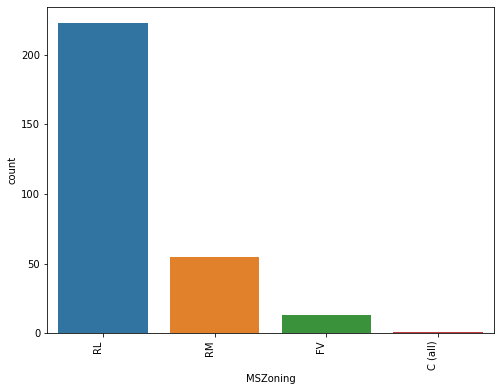

Pave    290
Grvl      2
Name: Street, dtype: int64


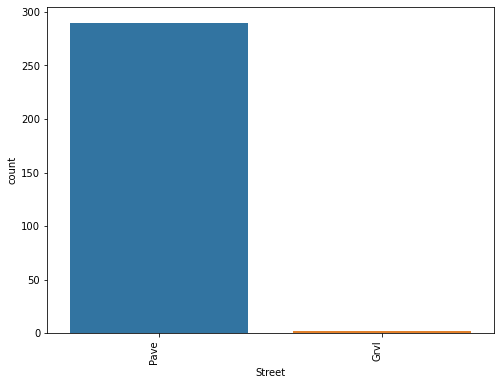

Reg    185
IR1     94
IR2      9
IR3      4
Name: LotShape, dtype: int64


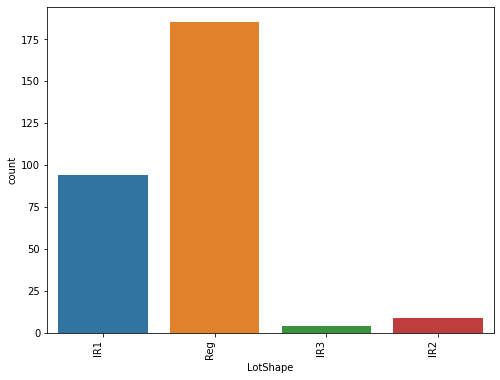

Lvl    265
Bnk     13
HLS      8
Low      6
Name: LandContour, dtype: int64


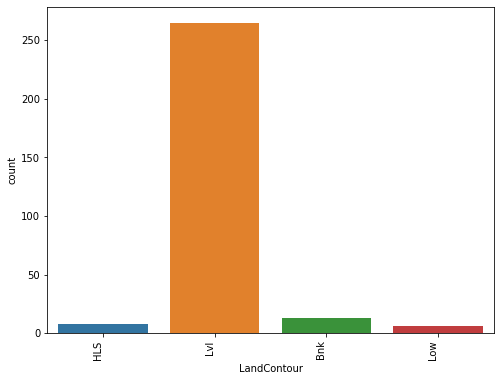

Inside     210
Corner      41
CulDSac     25
FR2         14
FR3          2
Name: LotConfig, dtype: int64


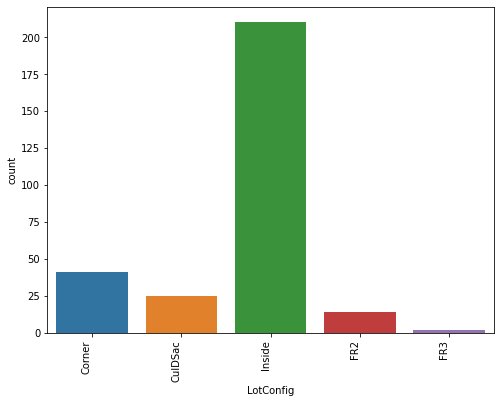

Gtl    277
Mod     14
Sev      1
Name: LandSlope, dtype: int64


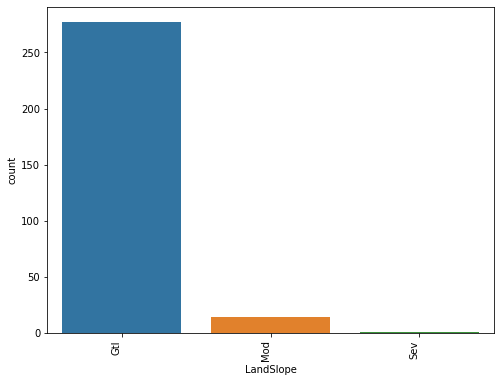

NAmes      43
CollgCr    32
OldTown    27
Somerst    18
Edwards    17
NridgHt    16
Gilbert    15
Mitchel    15
Timber     14
Sawyer     14
NWAmes     14
MeadowV     8
SawyerW     8
BrkSide     8
IDOTRR      7
NoRidge     6
StoneBr     6
Crawfor     6
BrDale      5
SWISU       4
ClearCr     4
Blmngtn     2
Veenker     2
NPkVill     1
Name: Neighborhood, dtype: int64


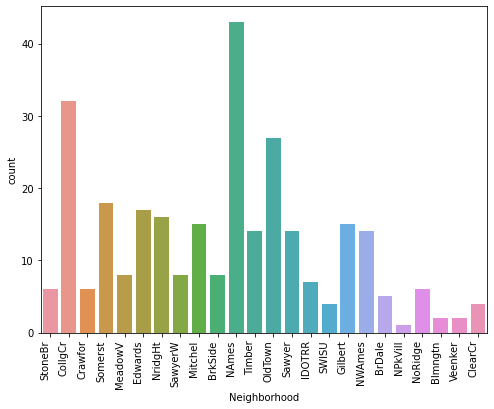

Norm      255
Feedr      14
Artery     10
RRAn        6
RRAe        2
PosN        2
PosA        2
RRNn        1
Name: Condition1, dtype: int64


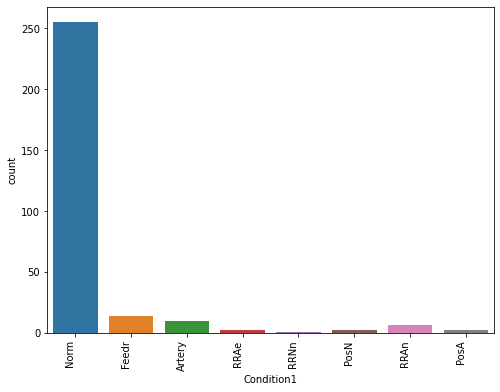

Norm    291
RRNn      1
Name: Condition2, dtype: int64


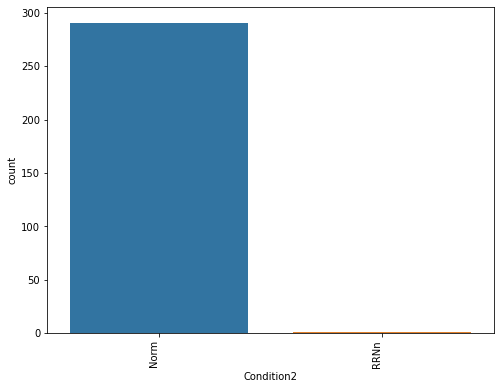

1Fam      239
TwnhsE     24
Twnhs      14
Duplex     11
2fmCon      4
Name: BldgType, dtype: int64


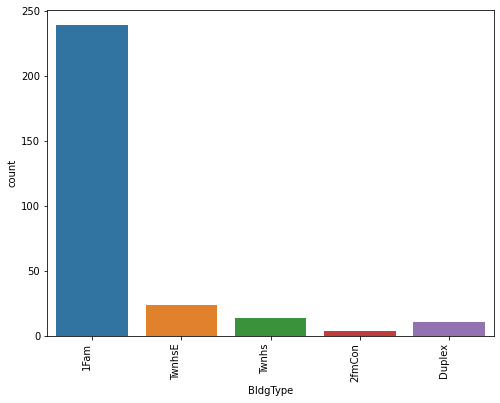

1Story    148
2Story     84
1.5Fin     33
SLvl       18
SFoyer      5
1.5Unf      2
2.5Fin      1
2.5Unf      1
Name: HouseStyle, dtype: int64


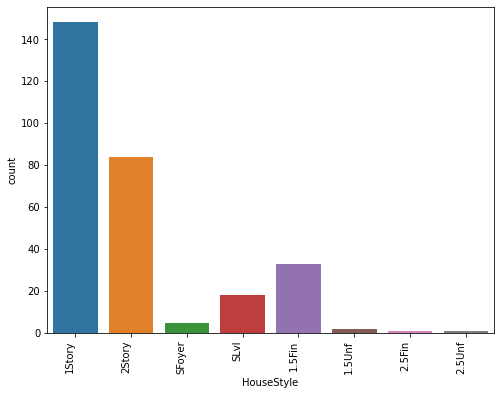

Gable      226
Hip         61
Gambrel      2
Mansard      2
Flat         1
Name: RoofStyle, dtype: int64


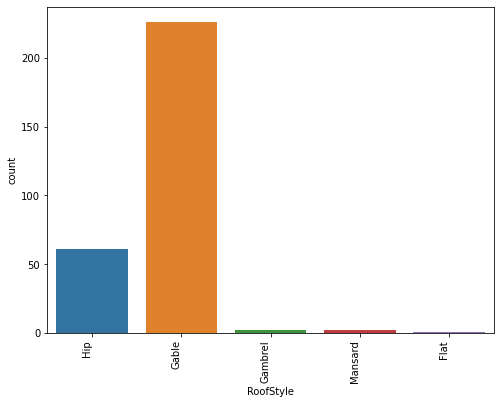

CompShg    290
WdShake      1
Tar&Grv      1
Name: RoofMatl, dtype: int64


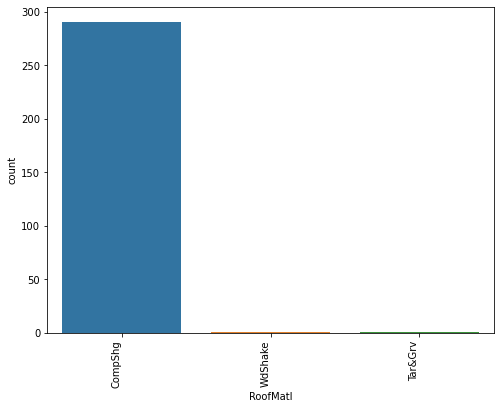

VinylSd    119
HdBoard     43
MetalSd     42
Wd Sdng     32
CemntBd     19
Plywood     15
BrkFace      9
WdShing      7
Stucco       3
AsbShng      1
BrkComm      1
CBlock       1
Name: Exterior1st, dtype: int64


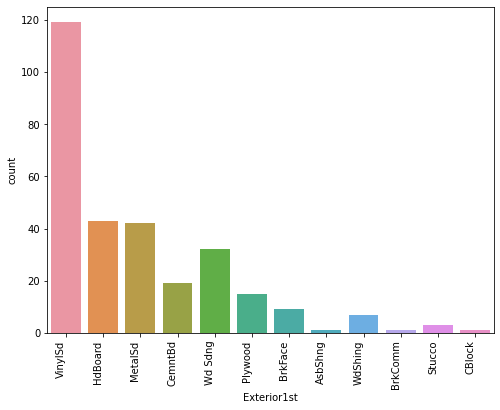

VinylSd    117
MetalSd     41
HdBoard     37
Wd Sdng     32
Plywood     24
CmentBd     18
Wd Shng      7
BrkFace      5
Stucco       3
Brk Cmn      2
ImStucc      2
AsbShng      2
Stone        1
CBlock       1
Name: Exterior2nd, dtype: int64


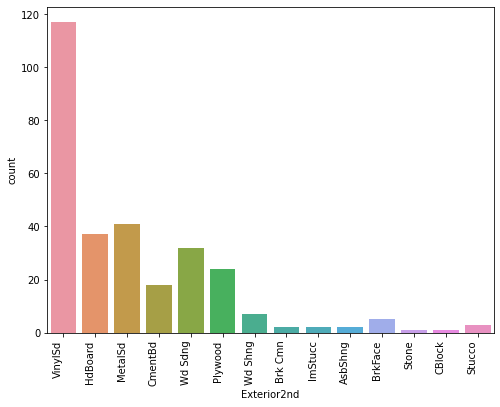

None       169
BrkFace     91
Stone       30
BrkCmn       2
Name: MasVnrType, dtype: int64


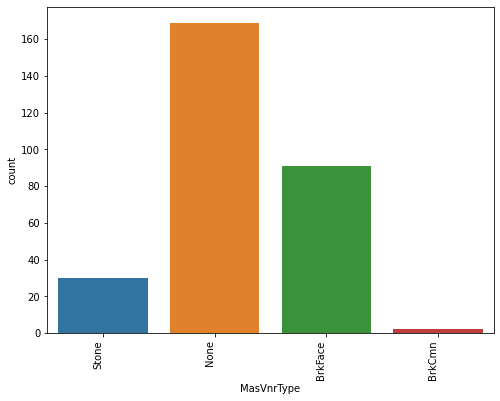

TA    189
Gd     91
Ex      9
Fa      3
Name: ExterQual, dtype: int64


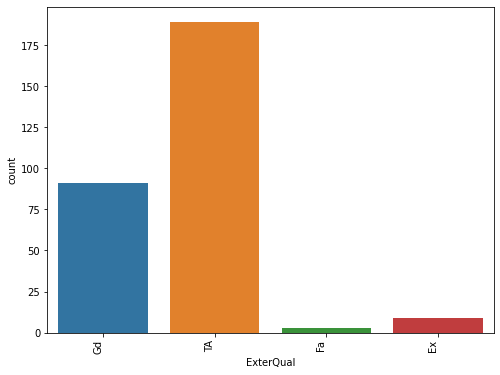

TA    260
Gd     29
Fa      2
Ex      1
Name: ExterCond, dtype: int64


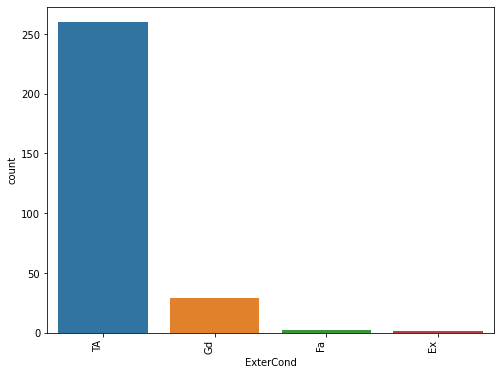

PConc     134
CBlock    118
BrkTil     34
Slab        3
Wood        2
Stone       1
Name: Foundation, dtype: int64


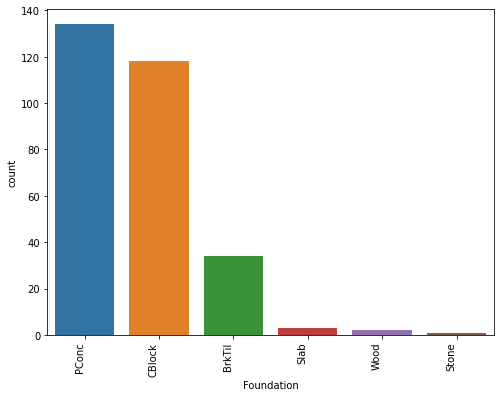

TA    139
Gd    120
Ex     27
Fa      6
Name: BsmtQual, dtype: int64


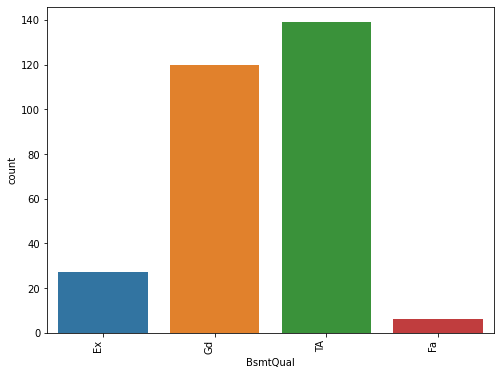

TA    277
Gd      9
Fa      6
Name: BsmtCond, dtype: int64


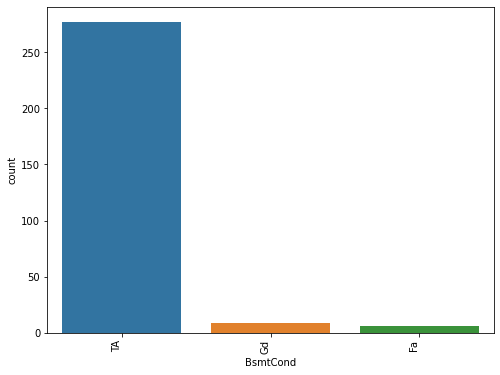

No    204
Av     41
Gd     26
Mn     21
Name: BsmtExposure, dtype: int64


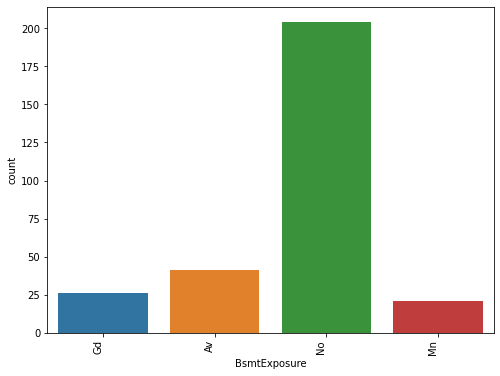

GLQ    95
Unf    85
ALQ    46
BLQ    27
Rec    24
LwQ    15
Name: BsmtFinType1, dtype: int64


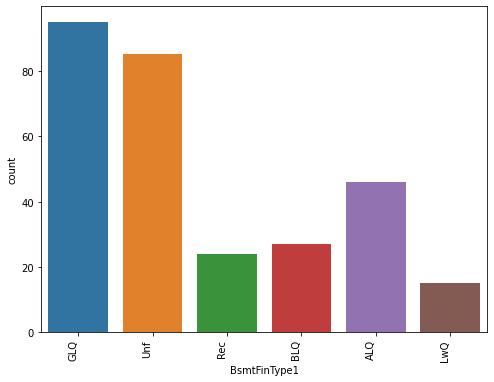

Unf    261
Rec     11
BLQ      9
LwQ      6
ALQ      3
GLQ      2
Name: BsmtFinType2, dtype: int64


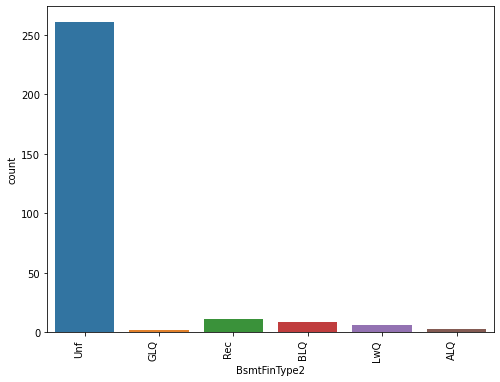

GasA    285
GasW      4
Grav      2
OthW      1
Name: Heating, dtype: int64


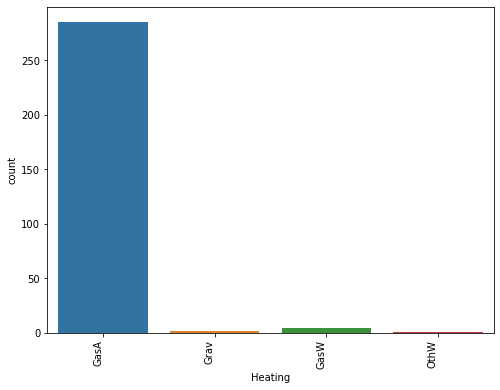

Ex    156
TA     76
Gd     49
Fa     11
Name: HeatingQC, dtype: int64


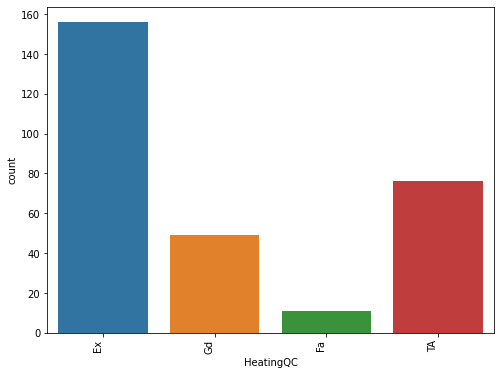

Y    275
N     17
Name: CentralAir, dtype: int64


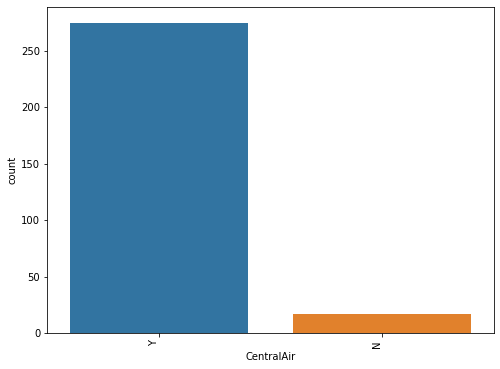

SBrkr    265
FuseA     20
FuseF      6
FuseP      1
Name: Electrical, dtype: int64


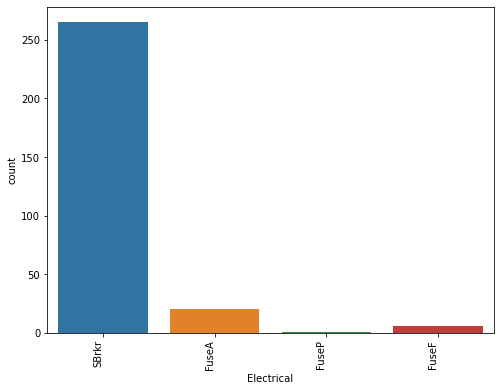

TA    157
Gd    108
Ex     18
Fa      9
Name: KitchenQual, dtype: int64


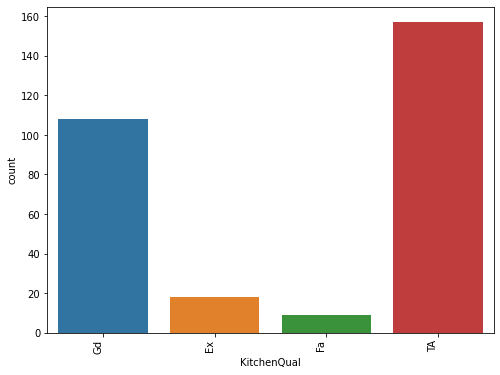

Typ     275
Min1      6
Min2      4
Mod       3
Maj1      3
Maj2      1
Name: Functional, dtype: int64


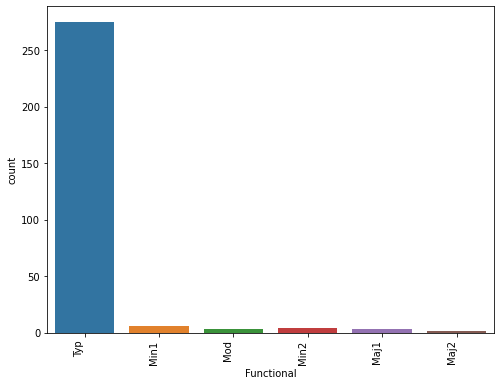

Attchd     196
Detchd      73
BuiltIn     18
Basment      3
2Types       1
CarPort      1
Name: GarageType, dtype: int64


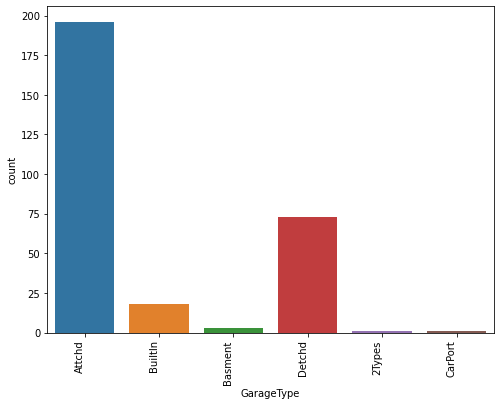

Unf    135
RFn     83
Fin     74
Name: GarageFinish, dtype: int64


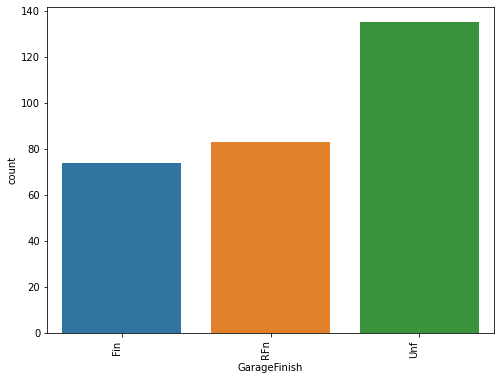

TA    278
Fa      9
Gd      3
Po      1
Ex      1
Name: GarageQual, dtype: int64


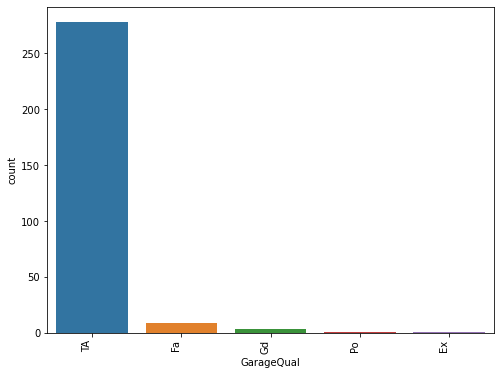

TA    282
Fa      7
Po      1
Ex      1
Gd      1
Name: GarageCond, dtype: int64


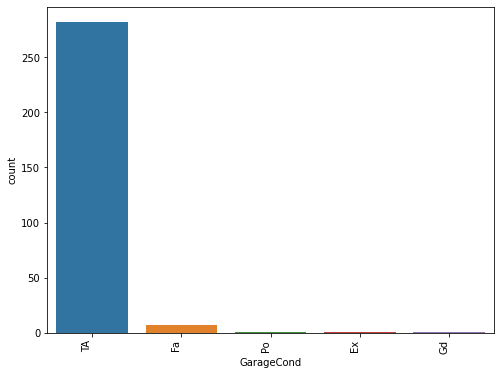

Y    269
N     16
P      7
Name: PavedDrive, dtype: int64


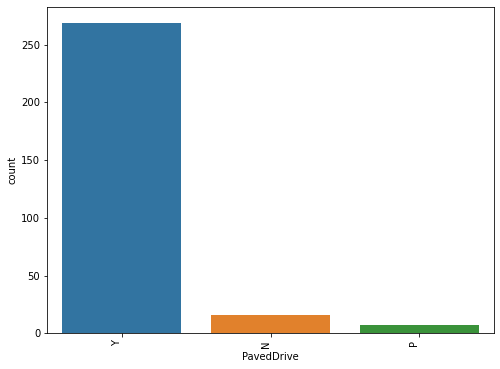

WD       268
New       16
COD        5
ConLD      1
CWD        1
ConLw      1
Name: SaleType, dtype: int64


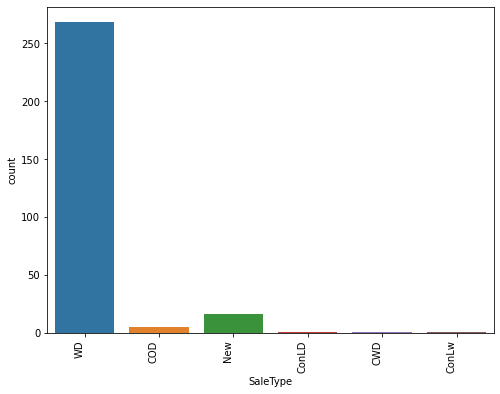

Normal     253
Abnorml     20
Partial     17
Family       2
Name: SaleCondition, dtype: int64


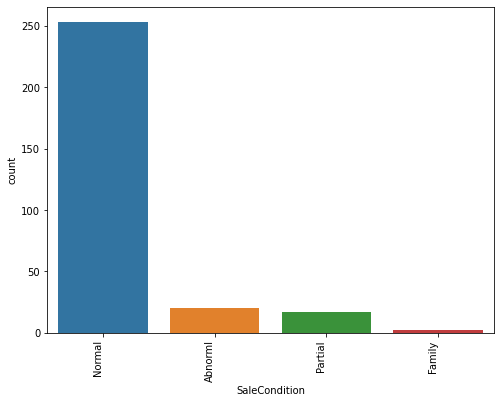

In [190]:
for i in cat_col:
    plt.figure(figsize=(8,6))
    a=sns.countplot(test[i])
    print(test[i].value_counts())
    a.set_xticklabels(a.get_xticklabels(), rotation=90, ha="right")
    plt.show()

20     108
60      55
50      31
120     18
30      17
160     16
80      15
90      11
70       7
180      4
190      4
45       2
75       2
85       1
40       1
Name: MSSubClass, dtype: int64


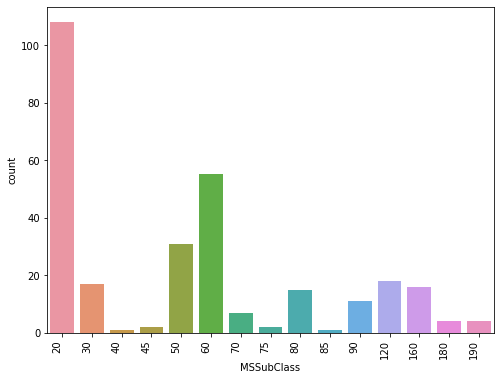

5     83
6     79
7     59
8     30
4     23
9     11
3      4
10     3
Name: OverallQual, dtype: int64


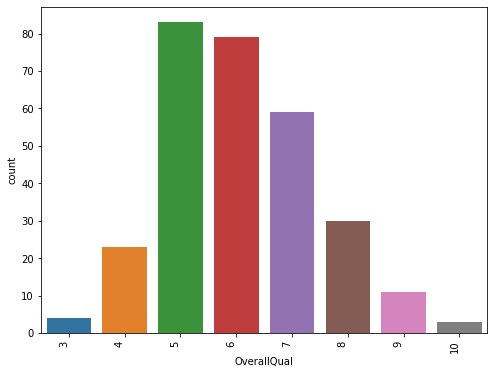

5    181
6     43
7     33
4     14
8     11
9      6
3      4
Name: OverallCond, dtype: int64


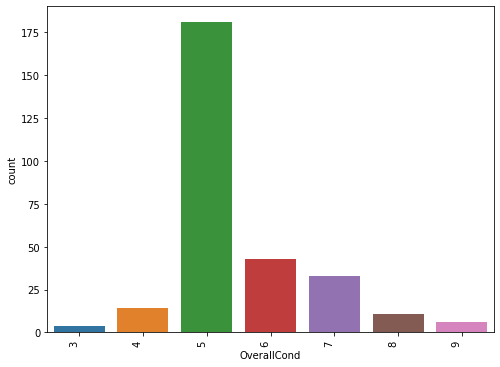

0      289
397      1
479      1
205      1
Name: LowQualFinSF, dtype: int64


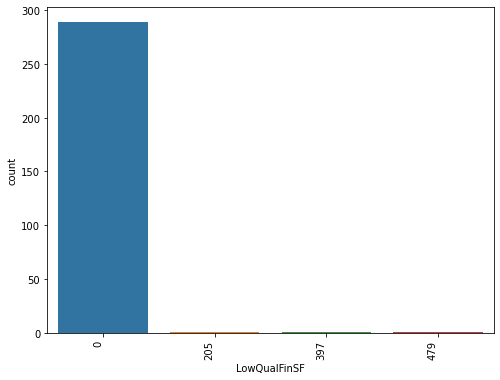

3    164
2     77
4     33
1     11
5      3
0      2
6      2
Name: BedroomAbvGr, dtype: int64


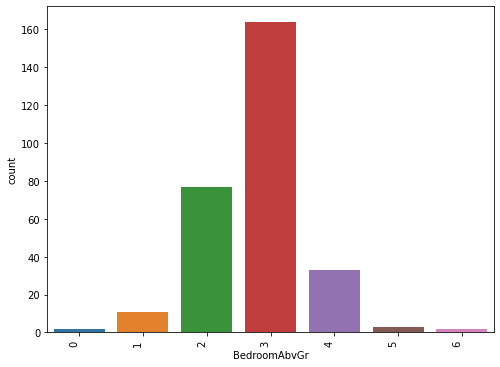

1    278
2     13
3      1
Name: KitchenAbvGr, dtype: int64


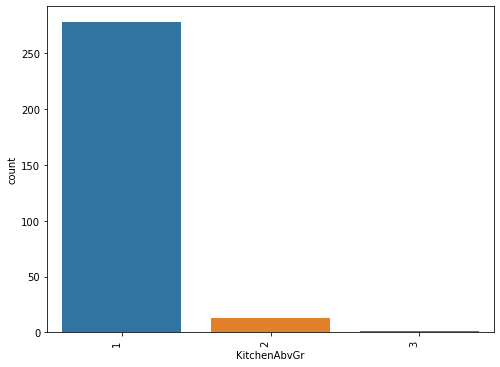

6     77
7     61
5     58
8     39
4     25
9     10
3      6
10     6
12     5
11     5
Name: TotRmsAbvGrd, dtype: int64


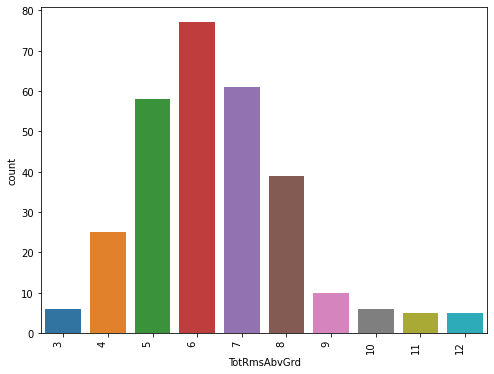

0    139
1    132
2     21
Name: Fireplaces, dtype: int64


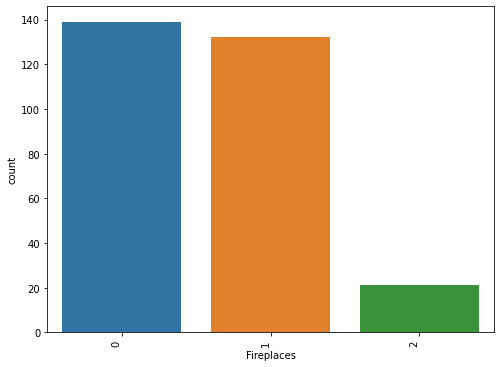

2    159
1     81
3     34
0     17
4      1
Name: GarageCars, dtype: int64


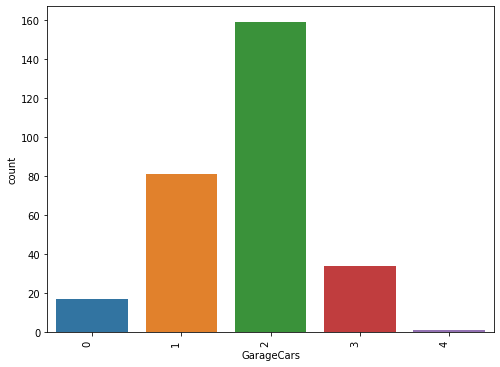

0    292
Name: PoolArea, dtype: int64


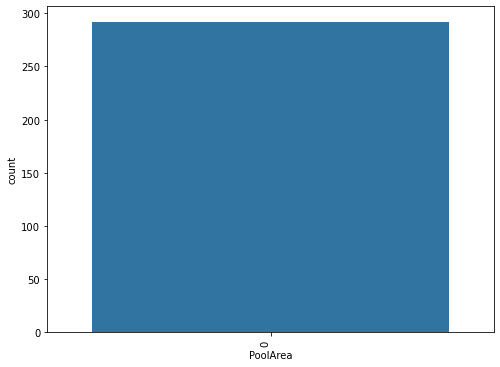

0       282
450       3
700       2
3500      1
400       1
600       1
500       1
480       1
Name: MiscVal, dtype: int64


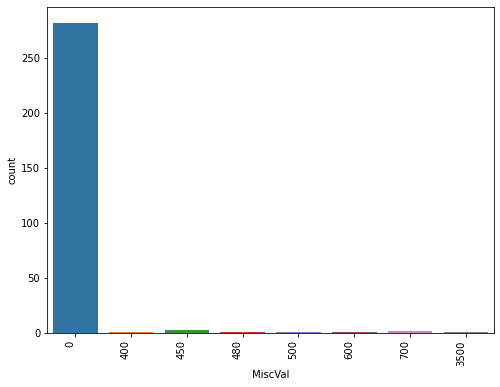

2    145
1     75
3     69
4      3
Name: PFullBath, dtype: int64


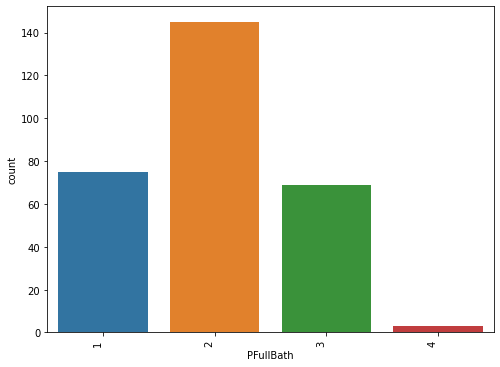

0    175
1    111
2      5
3      1
Name: PHalfBath, dtype: int64


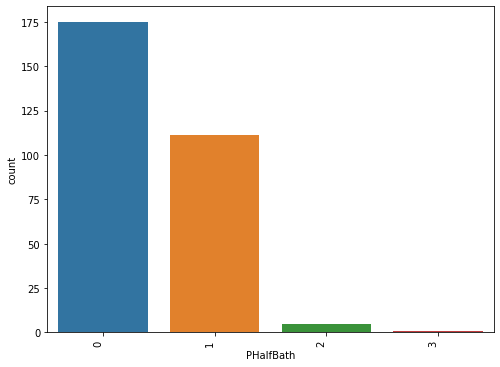

In [191]:
for i in dis_col:
    plt.figure(figsize=(8,6))
    a=sns.countplot(test[i])
    print(test[i].value_counts())
    a.set_xticklabels(a.get_xticklabels(), rotation=90, ha="right")
    plt.show()

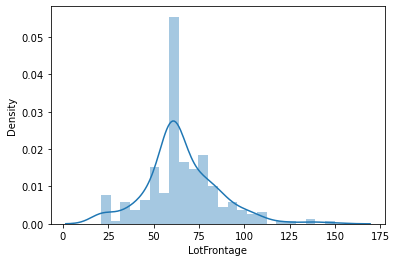

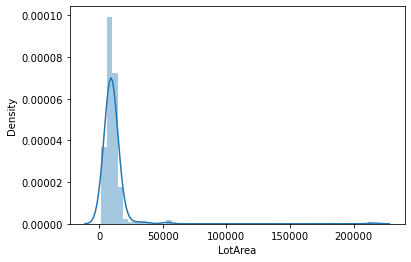

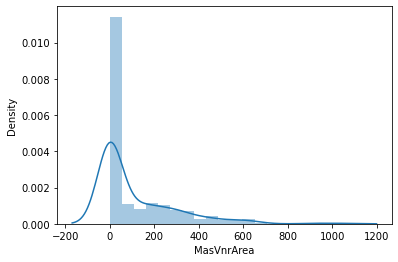

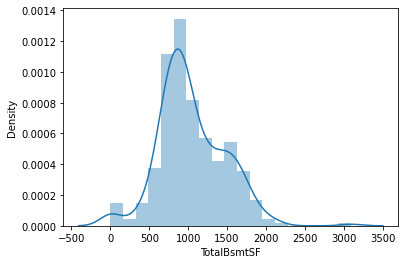

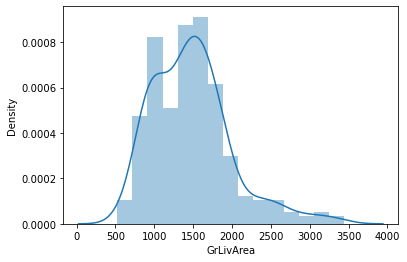

...

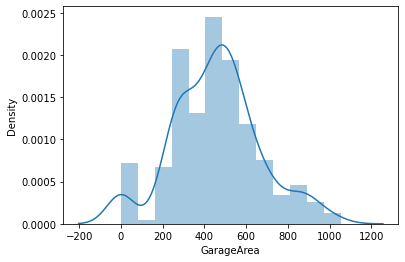

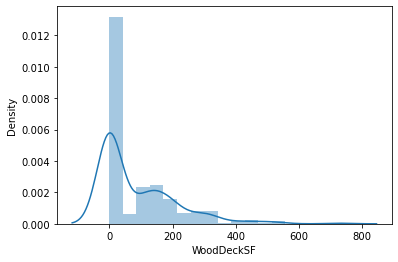

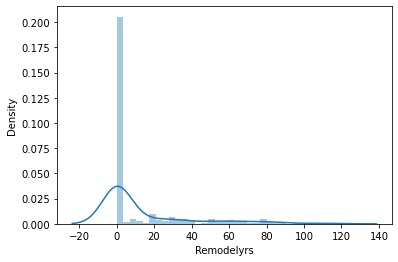

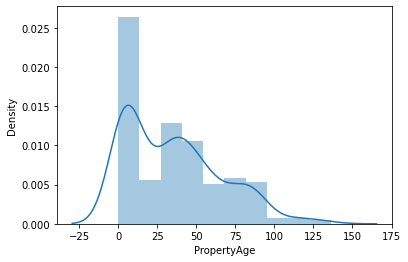

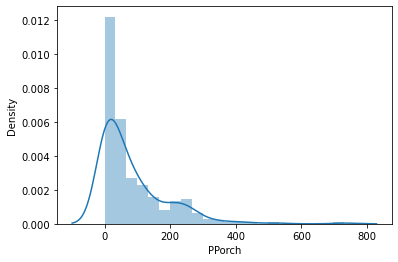

In [192]:
for i in con_col:
    plt.figure()
    sns.distplot(test[i],kde=True)

We can see for numerical columns data is not evenly distributed.

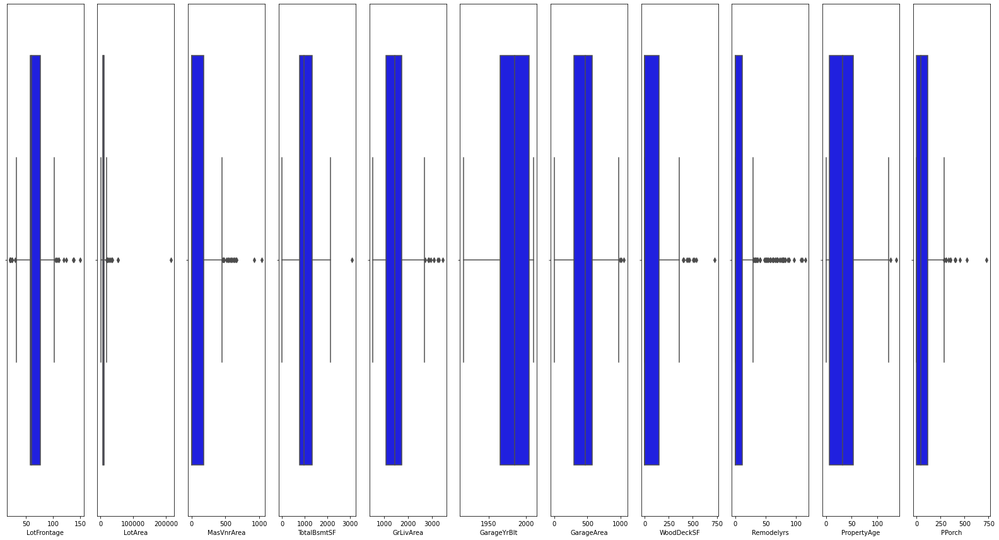

In [193]:
ncol=12
nrows=1
plt.figure(figsize=(2*ncol,1*ncol))
for i in range (0,len(con_col)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(test[con_col[i]],color='Blue',orient='v')
    plt.tight_layout()

We can see outliers in all numberical variables.

# Let's Work on features individually

* LotFrontage

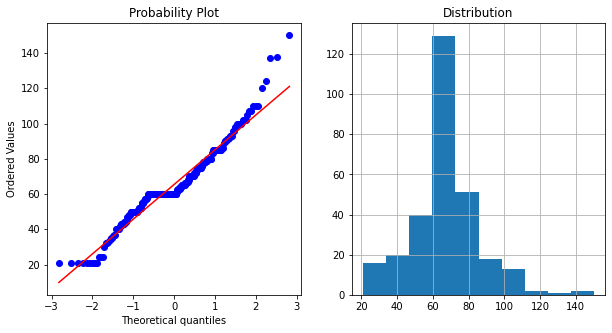

In [194]:
distribution(test,"LotFrontage")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [195]:
#We can see LotFrontage is less skewed hence i will go with IQR_h method
outlier_IQR_l(test,"LotFrontage")

(30.375, 103.375)

In [196]:
#changing values below lower limit
test.loc[test['LotFrontage']<= 31.125,'LotFrontage']=31.125
#changing values below upper limit
test.loc[test['LotFrontage']>= 108.125,'LotFrontage']=108.125

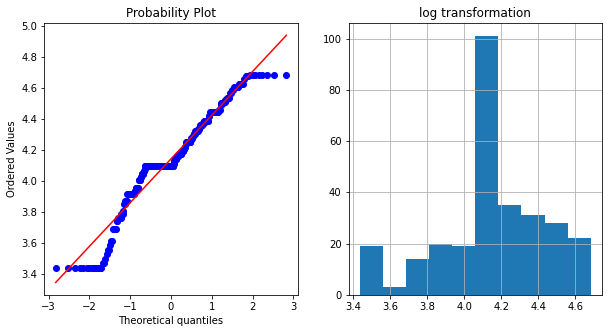

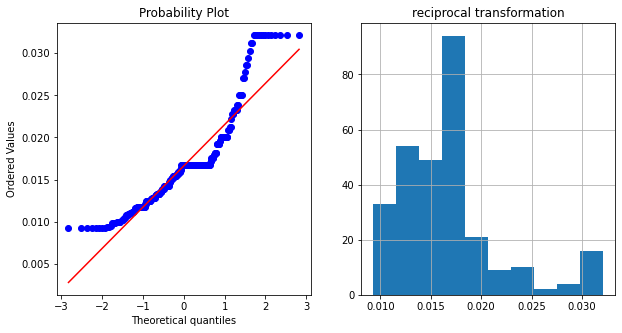

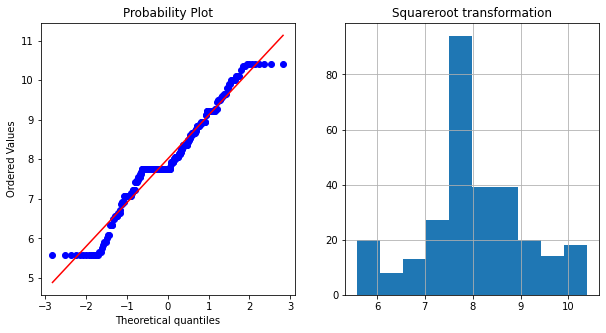

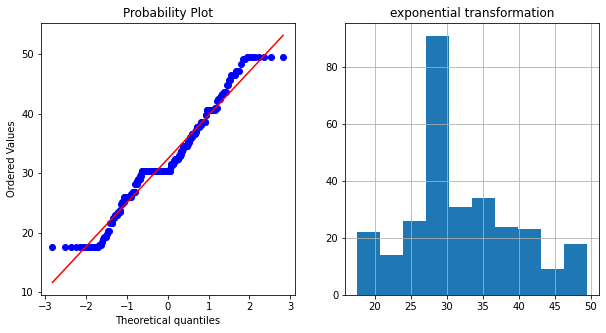

In [197]:
#Apply some transformation technique on LotFrontage for make distribution as normally distribution and check distribution by QQ plot

log_transform(test,"LotFrontage")
reciprocal_transform(test,"LotFrontage")
sqaureroot_transform(test,"LotFrontage")
exponential_transform(test,"LotFrontage")
for i in test.LotFrontage:
    if i > 0:
        break
    else:
        boxcox_transform(test,"LotFrontage")

In [198]:
# Apply squareroot transformation on LotFrontage feature
if 0 in test['LotFrontage'].unique():
    pass
else:
    test['LotFrontage']=test['LotFrontage']**(1/2)

* LotArea

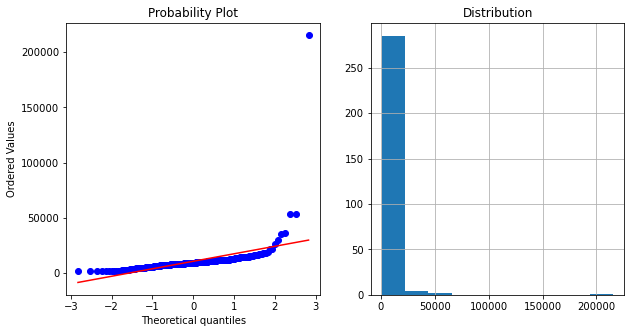

In [199]:
distribution(test,"LotArea")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [200]:
#We can see LotArea is highly skewed hence i will go with IQR_h method
outlier_IQR_h(test,"LotArea")

(-6176.25, 25035.0)

In [201]:
#changing values below lower limit
test.loc[test['LotArea']<= -6176.25,'LotArea']=-6176.25
#changing values below upper limit
test.loc[test['LotArea']>= 25035.0,'LotArea']=25035.0

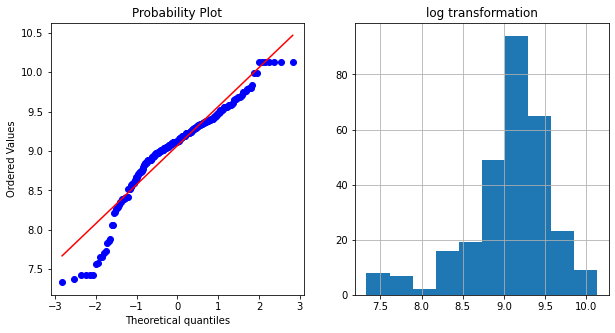

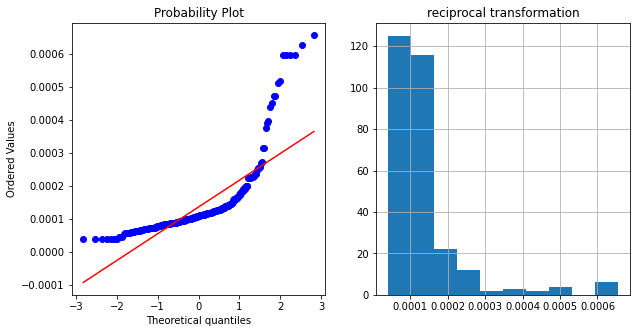

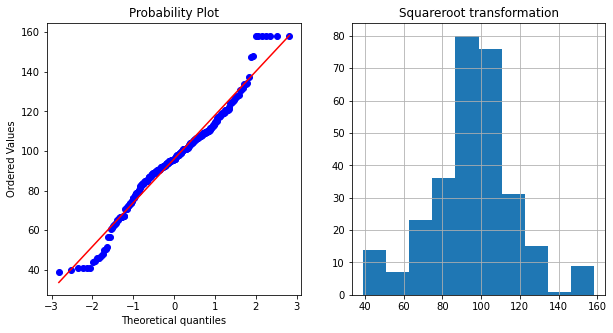

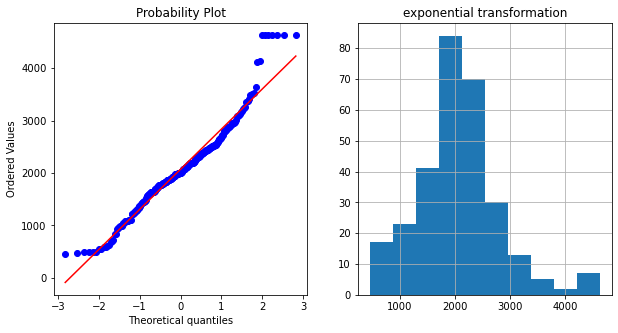

In [202]:
#Apply some transformation technique on LotArea for make distribution as normally distribution and check distribution by QQ plot

log_transform(test,"LotArea")
reciprocal_transform(test,"LotArea")
sqaureroot_transform(test,"LotArea")
exponential_transform(test,"LotArea")
for i in test.LotArea:
    if i > 0:
        break
    else:
        boxcox_transform(test,"LotArea")

In [203]:
# Apply squareroot transformation on LotArea feature
if 0 in test['LotArea'].unique():
    pass
else:
    test['LotArea']=test['LotArea']**(1/2)

* MasVnrArea

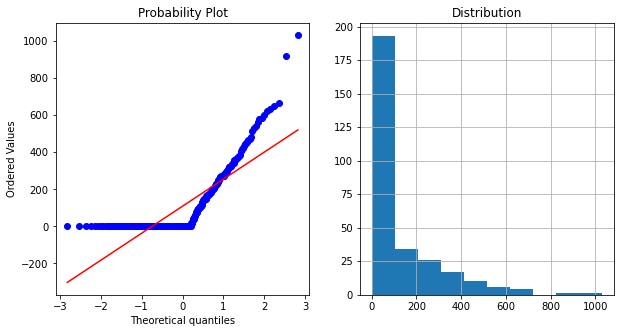

In [204]:
distribution(test,"MasVnrArea")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [205]:
#We can see MasVnrArea is highly skewed hence i will go with IQR_h method
outlier_IQR_h(test,"MasVnrArea")

(-540.0, 720.0)

In [206]:
#changing values below lower limit
test.loc[test['MasVnrArea']<= -540.0,'MasVnrArea']=-540.0
#changing values below upper limit
test.loc[test['MasVnrArea']>= 720.0,'MasVnrArea']=720.0

Transformation functions are  not working for MasVnrArea column.

* TotalBsmtSF

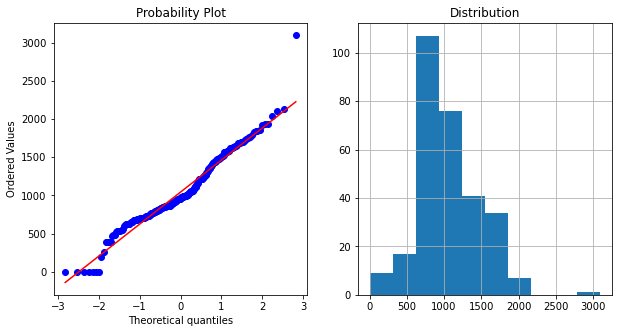

In [207]:
distribution(test,"TotalBsmtSF")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [208]:
#We can see TotalBsmtSF is highly skewed hence i will go with IQR_h method
outlier_IQR_h(test,"TotalBsmtSF")

(-879.0, 2972.75)

In [209]:
#changing values below lower limit
test.loc[test['TotalBsmtSF']<= -879.0,'TotalBsmtSF']=-879.0
#changing values below upper limit
test.loc[test['TotalBsmtSF']>= 2972.75,'TotalBsmtSF']=2972.75

Transformation functions are not working for TotalBsmtSF column.

* GrLivArea

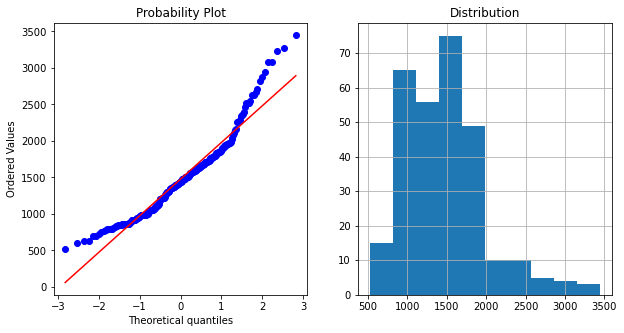

In [210]:
distribution(test,"GrLivArea")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [211]:
#We can see GrLivArea is highly skewed hence i will go with IQR_h method
outlier_IQR_h(test,"GrLivArea")

(-914.75, 3696.5)

In [212]:
#changing values below lower limit
test.loc[test['GrLivArea']<= -914.75,'GrLivArea']=-914.75
#changing values below upper limit
test.loc[test['GrLivArea']>= 3696.5,'GrLivArea']=3696.5

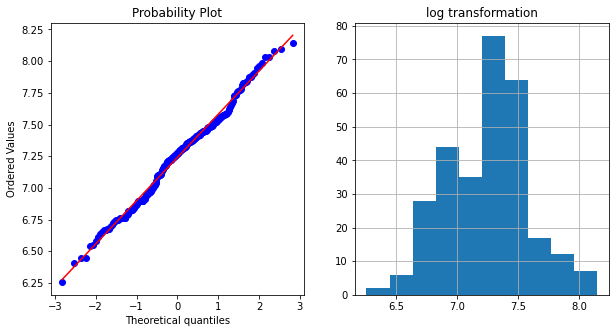

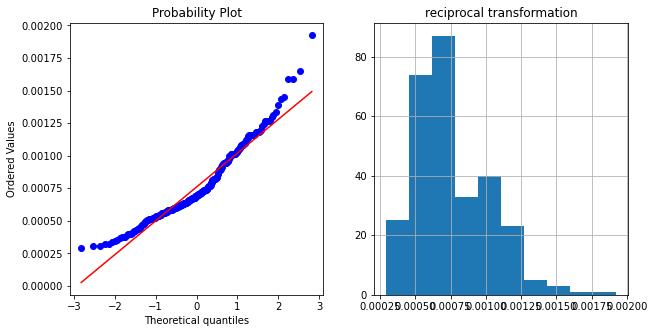

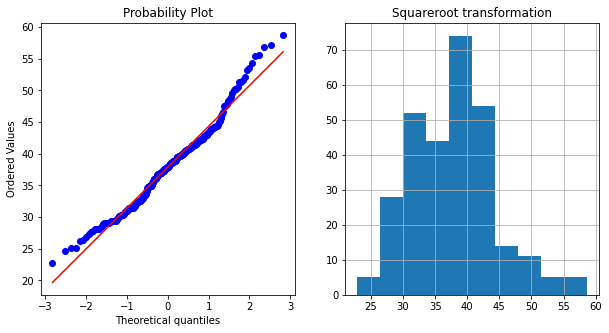

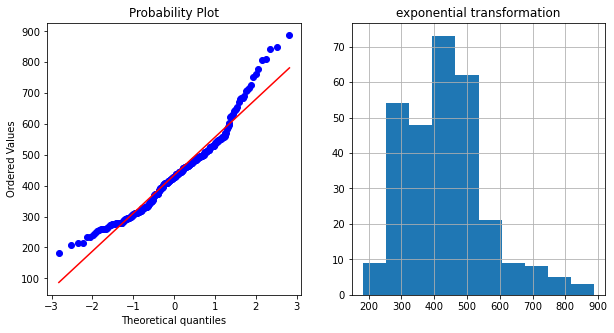

In [213]:
#Apply some transformation technique on GrLivArea for make distribution as normally distribution and check distribution by QQ plot

log_transform(test,"GrLivArea")
reciprocal_transform(test,"GrLivArea")
sqaureroot_transform(test,"GrLivArea")
exponential_transform(test,"GrLivArea")
for i in test.GrLivArea:
    if i > 0:
        break
    else:
        boxcox_transform(test,"GrLivArea")

In [214]:
# Apply log transformation on GrLivArea feature
if 0 in test['GrLivArea'].unique():
    pass
else:
    test['GrLivArea']=np.log(test['GrLivArea'])

* GarageYrBlt

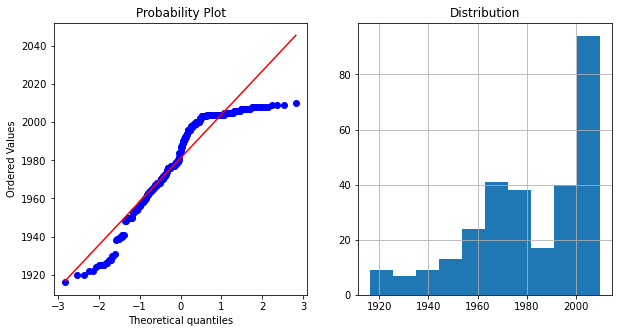

In [215]:
distribution(test,"GarageYrBlt")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [216]:
#We can see GarageYrBlt is high skewed hence i will go with IQR_h method
outlier_IQR_h(test,"GarageYrBlt")

(1848.0, 2121.0)

In [217]:
#changing values below lower limit
test.loc[test['GarageYrBlt']<= 1848.0,'GarageYrBlt']=1848.0
#changing values below upper limit
test.loc[test['GarageYrBlt']>= 2121.0,'GarageYrBlt']=2121.0

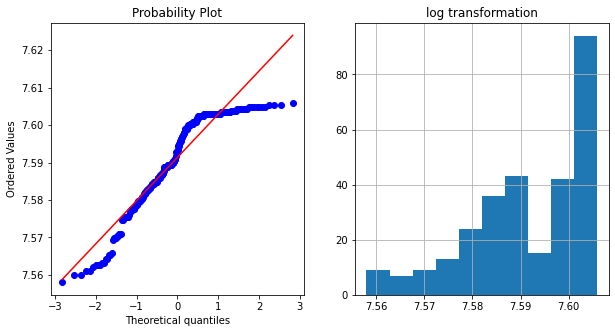

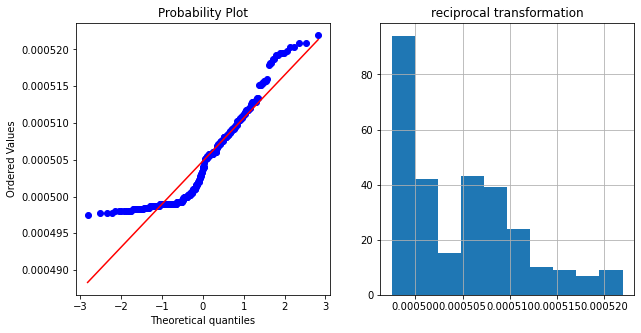

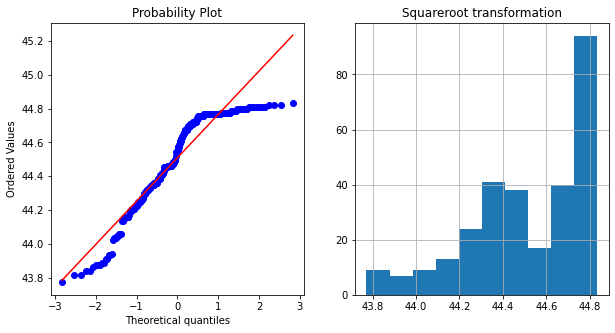

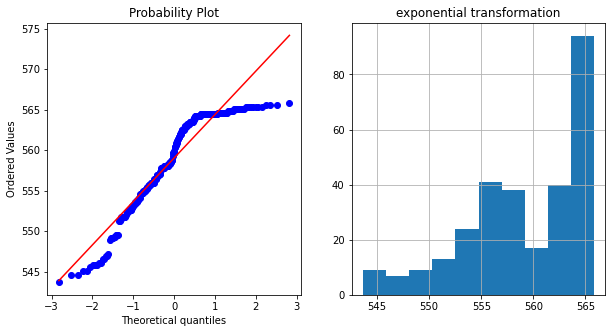

In [218]:
#Apply some transformation technique on GarageYrBlt for make distribution as normally distribution and check distribution by QQ plot

log_transform(test,"GarageYrBlt")
reciprocal_transform(test,"GarageYrBlt")
sqaureroot_transform(test,"GarageYrBlt")
exponential_transform(test,"GarageYrBlt")
for i in test.GarageYrBlt:
    if i > 0:
        break
    else:
        boxcox_transform(test,"GarageYrBlt")

In [219]:
# Apply squareroot transformation on GarageYrBlt feature
if 0 in test['GarageYrBlt'].unique():
    pass
else:
    test['GarageYrBlt']=test['GarageYrBlt']**(1/2)

* GarageArea

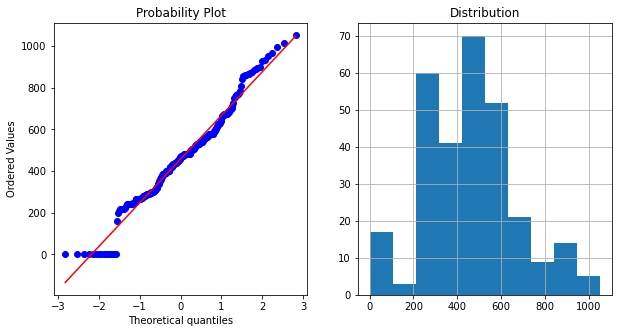

In [220]:
distribution(test,"GarageArea")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [221]:
#We can see GarageArea is less skewed hence i will go with IQR_l method
outlier_IQR_l(test,"GarageArea")

(-104.625, 974.375)

In [222]:
#changing values below lower limit
test.loc[test['GarageArea']<= -104.625,'GarageArea']=-104.625
#changing values below upper limit
test.loc[test['GarageArea']>= 974.375,'GarageArea']=974.375

Transformation functions are not working for GarageArea column.

* WoodDeckSF

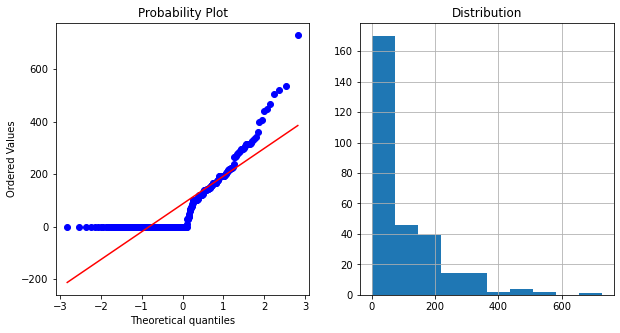

In [223]:
distribution(test,"WoodDeckSF")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [224]:
#We can see WoodDeckSF is highly skewed hence i will go with IQR_h method
outlier_IQR_h(test,"WoodDeckSF")

(-447.75, 597.0)

In [225]:
#changing values below lower limit
test.loc[test['WoodDeckSF']<= -447.75,'WoodDeckSF']=-447.75
#changing values below upper limit
test.loc[test['WoodDeckSF']>= 597.0,'WoodDeckSF']=597.0

Transformation functions are not working for WoodDeckSF column.

* Remodelyrs

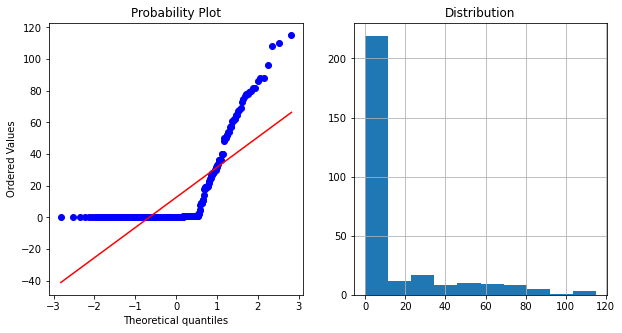

In [226]:
distribution(test,"Remodelyrs")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [227]:
#We can see Remodelyrs is highly skewed hence i will go with IQR_h method
outlier_IQR_h(test,"Remodelyrs")

(-35.25, 47.0)

In [228]:
#changing values below lower limit
test.loc[test['Remodelyrs']<= -35.25,'Remodelyrs']=-35.25
#changing values below upper limit
test.loc[test['Remodelyrs']>=  47.0,'Remodelyrs']= 47.0

Transformation functions are not working for Remodelyrs column.

* PropertyAge

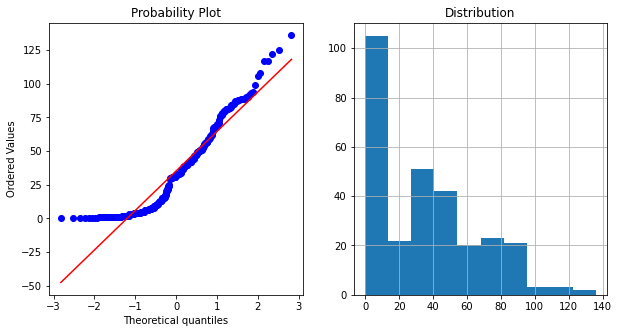

In [229]:
distribution(test,"PropertyAge")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [230]:
#We can see PropertyAge is highly skewed hence i will go with IQR_h method
outlier_IQR_h(test,"PropertyAge")

(-132.75, 192.75)

In [231]:
#changing values below lower limit
test.loc[test['PropertyAge']<= -132.75,'PropertyAge']=-132.75
#changing values below upper limit
test.loc[test['PropertyAge']>= 192.75,'PropertyAge']=192.75

Transformation functions are not working for PropertyAge column.

* PPorch

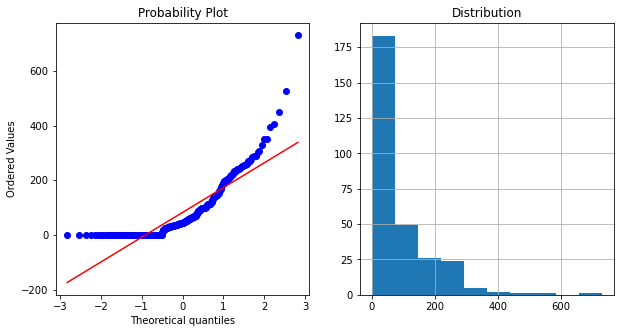

In [232]:
distribution(test,"PPorch")
plt.gcf().axes[0].xaxis.get_major_formatter().set_scientific(False)

In [233]:
#We can see PPorch is highly skewed hence i will go with IQR_h method
outlier_IQR_h(test,"PPorch")

(-342.0, 456.0)

In [234]:
#changing values below lower limit
test.loc[test['PPorch']<= -342.0,'PPorch']=-342.0
#changing values below upper limit
test.loc[test['PPorch']>= 456.0,'PPorch']=456.0

Transformation functions are not working for PPorch columns.

In [235]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()

for i in cat_col:
    test[i]=oe.fit_transform(test[i].values.reshape(-1,1))

In [236]:
a=['BsmtCond','Street','Condition2','LandContour','BsmtFinType2','LandSlope','MasVnrType','MiscVal','LowQualFinSF']
test.drop(a, axis=1, inplace=True)

# Skewness and outliers removal:

We have already delt with outliers.

In [237]:
test.skew()

MSSubClass        1.358597
MSZoning          0.187174
LotFrontage      -0.060732
LotArea          -0.001331
LotShape         -0.639195
LotConfig        -1.204667
Neighborhood      0.046894
Condition1        2.808950
BldgType          1.997202
HouseStyle        0.386773
OverallQual       0.397312
OverallCond       1.209714
RoofStyle         1.386333
RoofMatl         13.717569
Exterior1st      -0.643455
Exterior2nd      -0.672944
MasVnrArea        1.655862
ExterQual        -1.920606
ExterCond        -3.595056
Foundation        0.380626
BsmtQual         -1.348604
BsmtExposure     -1.289092
BsmtFinType1      0.040656
TotalBsmtSF       0.463377
Heating           8.212666
HeatingQC         0.408904
CentralAir       -3.792878
Electrical       -2.990818
GrLivArea        -0.022754
BedroomAbvGr      0.075315
KitchenAbvGr      4.849432
KitchenQual      -1.493903
TotRmsAbvGrd      0.805535
Functional       -4.911353
Fireplaces        0.540164
GarageType        0.948083
GarageYrBlt      -0.752863
G

In [238]:
for i in con_col:
    if -0.5 < skew(test[i]) > 0.5:
        print(i,"variables skewness is ", skew(test[i]))
    elif skew(test[i]) < -0.5:
        print(i,"variables skewness is ", skew(test[i]))

MasVnrArea variables skewness is  1.6473432566348463
GarageYrBlt variables skewness is  -0.7489895696950052
WoodDeckSF variables skewness is  1.5411753447186793
Remodelyrs variables skewness is  1.4394736576183615
PropertyAge variables skewness is  0.7530764234008431
PPorch variables skewness is  1.5248599919957415


In [239]:
#We need to remove skewness for remaining columns
test['MasVnrArea']=np.sqrt(test['MasVnrArea'])
test['GarageYrBlt']=np.sqrt(test['GarageYrBlt'])
test['WoodDeckSF']=np.sqrt(test['WoodDeckSF'])
test['Remodelyrs']=np.sqrt(test['Remodelyrs'])
test['PropertyAge']=np.sqrt(test['PropertyAge'])
test['PPorch']=np.sqrt(test['PPorch'])

# Lets perform standardization:

In [240]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
sc.fit_transform(test)

array([[-0.85605433, -0.28700579,  1.13406749, ...,  1.36813555,
        -0.77645722,  0.03653503],
       [ 1.43198105, -0.28700579, -0.23415329, ...,  0.        ,
        -0.77645722, -1.20397444],
       [-0.85605433, -0.28700579, -0.23415329, ...,  0.        ,
        -0.77645722,  0.93056148],
       ...,
       [-0.85605433, -0.28700579, -0.23415329, ...,  0.        ,
        -0.77645722, -1.20397444],
       [-0.16964372,  1.80813647, -0.8386174 , ...,  0.        ,
        -0.77645722,  0.14154699],
       [ 2.3471952 ,  1.80813647, -2.17498721, ..., -1.36813555,
         1.0519743 , -1.20397444]])

# load the model

In [241]:
fitted_model=pickle.load(open("RSVHousing.pkl","rb"))

In [242]:
fitted_model

RandomizedSearchCV(cv=5, estimator=DecisionTreeRegressor(),
                   param_distributions={'criterion': ['mse', 'friedman_mse',
                                                      'mae', 'poisson'],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'random_state': range(0, 20),
                                        'splitter': ['best', 'random']})

# prediction over test data

In [243]:
prediction=fitted_model.predict(test)

In [244]:
prediction=fitted_model.best_estimator_.predict(test)

In [245]:
prediction

array([315000., 197000., 270000., 140000., 143250.,  72500., 138000.,
       307000., 260400., 140000.,  72500., 143900., 147000., 228950.,
       147000., 140000.,  93500., 140000., 160000., 187500., 155000.,
       143750., 121500.,  34900., 119000., 119900., 143750., 144500.,
       160000., 113000., 147000., 187500., 302000., 169900.,  89000.,
       133000., 156000., 117500., 151000., 128000., 122000., 232000.,
       178400., 160200., 122000., 120500., 119000., 109500., 160200.,
       377500., 114500., 171000.,  34900.,  90350., 187500., 113000.,
       137000., 178400.,  55993., 249700.,  72500., 149900., 122000.,
       136500., 160200.,  72500., 179000., 178400., 153000., 169900.,
       275000., 160000., 140000., 119000., 128000., 178400., 282922.,
       180000., 282922., 153337., 180000., 119000., 132250., 121500.,
       160000., 133000., 113000., 324000., 151000., 143750., 311872.,
       119500., 120500., 119500., 160000., 147000., 209500., 133000.,
       235000., 1470